## Visualize interrater results

produce the plots as found in the paper.

#### Loading all the spreadsheet data

In [1]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt
import seaborn as sns
import pandas as pd
from natsort import natsorted
from tqdm import tqdm

In [2]:
import matplotlib as mpl
mpl.__version__

'3.4.0'

In [3]:
results_folder = "./results/"
out_domain_results = os.listdir(results_folder)

In [4]:
out_domain_results = [i for i in out_domain_results if ".csv" in i]

In [5]:
UNCERTAINTY_TYPES = {
    "SEnt",
    "MC-Drop",
    "Ens",
    "Evid",
    "Ind",
    "P-Unet",
    "SSN",
    "SSN-Ens",
}

In [6]:
def convert_files_to_large_df(folder, filenames, excluded_rows = [], dataset_name="mss3"):
    dfs = []
    for fn in tqdm(natsorted(filenames)):
        if dataset_name not in fn:
            continue
        df = pd.read_csv(os.path.join(folder, fn))
        if "_evid_" in fn:
            uncertainty_type = "Evid"
        elif "_deterministic_" in fn:
            uncertainty_type = "SEnt"
        elif "_ind_" in fn:
            uncertainty_type = "Ind"
        elif "_punet_" in fn:
            uncertainty_type = "P-Unet"
        elif "_ens" in fn and "ssn" not in fn:
            uncertainty_type = "Ens"
        elif "_mc_drop" in fn:
            uncertainty_type = "MC-Drop"
        elif "_ssn_ens_" in fn:
            uncertainty_type = "SSN-Ens"
        elif "_ssn_" in fn and "_ens" not in fn:
            uncertainty_type = "SSN"
        else:
            print("uncertainty type unclear for ", fn)
            continue
            
        cv_fold = fn.split("_")[-2][-1]
        num_samples = fn.split("_")[-1][2:4]
        if num_samples[-1] == '.':
            num_samples = num_samples[:-1]
        
        if len(excluded_rows) > 0:
            df = df.drop(index=excluded_rows, inplace=False)
        df = df.rename(columns = {key:key + f"_ss{num_samples}" for key in df.keys() if key.split("_")[-1][0:2] != "ss" and "Unnamed" not in key})
        df['uncertainty_type'] = [uncertainty_type for _ in range(len(df))]
        df['cv_fold'] = [cv_fold for _ in range(len(df))]
        
        if int(num_samples) > 10 and uncertainty_type == "Ens":
            continue # we only have ensemble up to size 10, but the results got copied into values greater than 10 somehow..

        dfs.append(df)
    
    return pd.concat(dfs, ignore_index=False)

In [7]:
mss3_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="mss3")
lbc_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="lbc")
challenge_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="challenge")
# challenge_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="challenge")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 926/926 [00:18<00:00, 50.57it/s]


In [8]:
len(mss3_df)

16592

In [9]:
mss3_df.keys()

Index(['Unnamed: 0', 'rmses_ss2', 'IR_rmses_ss2', 'rater0_sample_top_dice_ss2',
       'rater0_sample_best_avd_ss2', 'rater1_sample_top_dice_ss2',
       'rater1_sample_best_avd_ss2', 'GED_vol_sorted_ss2',
       'UIRO_curves_t0.00_ss2', 'JUEO_curves_t0.00_ss2',
       ...
       'pv_uiro_high_overlap_all_t0.64_ss30',
       'pv_uiro_high_overlap_all_t0.65_ss30',
       'pv_uiro_high_overlap_all_t0.66_ss30',
       'pv_uiro_high_overlap_all_t0.67_ss30',
       'pv_uiro_high_overlap_all_t0.68_ss30',
       'pv_uiro_high_overlap_all_t0.69_ss30', 'GED_dice_sorted_ss30',
       'rater0_best_dice_dsorted_ss30', 'rater1_best_dice_dsorted_ss30',
       'mean_gt_vols_ss30'],
      dtype='object', length=4674)

### 95% confidences

In [10]:
from scipy.stats import t as t_distribution
def mean_and_95_conf_over_cvfold(df, metric, return_sem=True, per_individual=False, individual_uncert_type='SSN-Ens'):
    
    if per_individual: # calculate the mean and stderror/95% for a particular uncertainty type over each individual separately
        cv_scores = df[df['uncertainty_type']==individual_uncert_type].groupby(['Unnamed: 0'])[metric]
    else: # calculate the mean and stderror/95% for all uncertainty types over all folds (i.e over all individuals together)
        cv_scores = df.groupby(['uncertainty_type', 'cv_fold'])[metric].mean().groupby('uncertainty_type')
        
    mean = cv_scores.mean().rename(f"{metric} mean", axis='index')
    std = cv_scores.std(ddof=1)
    size = cv_scores.size()
    # print(size)
    sem_value = std / (np.sqrt(size))
    
    confidence_level = 0.95
    degrees_of_freedom = size - 1
    margin_of_error = t_distribution.ppf((1 + confidence_level) / 2, degrees_of_freedom) * sem_value
    margin_of_error = margin_of_error.rename(f"{metric} 95%")
    sem_value  = sem_value.rename(f"{metric} 95%")
    confidence_interval = (mean - margin_of_error, mean + margin_of_error)
    
    if return_sem:
        return pd.concat([mean, sem_value], axis=1)#, confidence_interval[0], confidence_interval[1]], axis=1)
    else:
        return pd.concat([mean, margin_of_error], axis=1)

In [11]:
SAMPLING_UNCERTAINTY_TYPES = {
    "MC-Drop",
    "Ens",
    "Ind",
    "P-Unet",
    "SSN",
    "SSN-Ens",
}

In [12]:
import matplotlib.cm as cm 
cmap = cm.Set2

UNCERTAINTY_COLOURS = {
    'Ens':'blue5',
    'Evid':'black',
    'Ind':'teal5',
    'MC-Drop':'pink5',
    'P-Unet':'lime5',
    'SEnt':'blue',
    'SSN':'gray5',
    'SSN-Ens':'orange5',
}


In [13]:
from collections import defaultdict
from scipy.stats import t as t_distribution


In [14]:
def plot_metric_as_samples_increase(ax, df, metric, title, dolegend, limited_sample_nums=False, xlim=None, ylim=None, xlabel=None, ylabel=None):
    metric_vals = {}
    if limited_sample_nums:
        sample_nums = [2, 10, 30]
    else:
        sample_nums = [2,3,5,7,10,15,20,25,30]

    try:
        dataset_averages = df.groupby(['uncertainty_type', 'cv_fold'])[[f'{metric}_ss{s}' for s in sample_nums]].mean().groupby(['uncertainty_type'])
    except:
        dataset_averages = df.groupby(['uncertainty_type', 'cv_fold'])[[f'{metric}_ss{s}' for s in [10]]].mean().groupby(['uncertainty_type'])
        sample_nums = [10]
    
    mean_score = dataset_averages.mean()
    std = dataset_averages.std()
    size = 6#dataset_averages.size()

    sem_value = std / (np.sqrt(size))
    confidence_level = 0.95
    degrees_of_freedom = size - 1
    # margin_of_error = t_distribution.ppf((1 + confidence_level) / 2, degrees_of_freedom) * sem_value

    for key in SAMPLING_UNCERTAINTY_TYPES:

        # plt.plot(sample_nums, mean_score.loc[key].values, '--', alpha=0.7, color=UNCERTAINTY_COLOURS[key])
        ax.scatter(sample_nums, mean_score.loc[key].values, label=key, zorder=3, color=UNCERTAINTY_COLOURS[key])
        ax.errorbar(sample_nums, mean_score.loc[key].values, yerr= sem_value.loc[key].values,
                     color=UNCERTAINTY_COLOURS[key], capsize=5, linestyle='--', linewidth=2)
    
    if dolegend:
        ax.legend(ncols=2, prop={'size': 10, 'weight': 'bold'});
    
    if xlabel:
        ax.set_xlabel(xlabel)
    if ylabel:
        ax.set_ylabel(ylabel)
    
    plt.title(title, fontsize=15)
    
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
    ax.spines['left'].set_linewidth(1.2)  # Thicker left spine

    

### best dice, best avd and GeD

In [16]:
def per_dataset_plot_num_inferences_plot(metric, ylabel, suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=None, limited_sample_nums=False, datasets=[lbc_df, mss3_df, challenge_df], xlabel=True):
    fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=True)
    axs = fig.subplots(nrows=1, ncols=3)
    
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel="Number of Inferences" if xlabel else None, ylabel=ylabel, grid=True, fontsize=15)
    
    # plt.figure(figsize=(12, 4))
    plt.subplot(1,3,1)
    plot_metric_as_samples_increase(axs[0], datasets[0], metric, titles[0], False, xlim=xlim, ylim=ylim, limited_sample_nums=limited_sample_nums)
    plt.subplot(1,3,2)
    plot_metric_as_samples_increase(axs[1], datasets[1], metric, titles[1], False, xlim=xlim, ylim=ylim, limited_sample_nums=limited_sample_nums)
    plt.subplot(1,3,3)
    plot_metric_as_samples_increase(axs[2], datasets[2], metric, titles[2], True, xlim=xlim, ylim=ylim, limited_sample_nums=limited_sample_nums)
    fig.save(f"plot_results/{suptitle}.pdf")

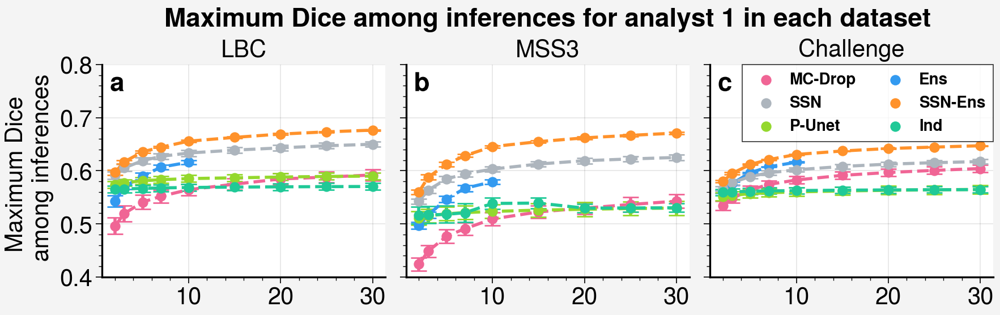

In [144]:
per_dataset_plot_num_inferences_plot("rater0_best_dice_dsorted", suptitle="Maximum Dice among inferences for analyst 1 in each dataset", ylabel="Maximum Dice \n among inferences", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.4, 0.8), xlabel=False)

In [17]:
def dice_and_avd_per_dataset_plot_num_inferences_plot(metric1, ylabel1, metric2, ylabel2, suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim1=None, ylim2=None, limited_sample_nums=False, datasets=[lbc_df, mss3_df, challenge_df]):
    fig = pplt.figure(refwidth="20em", refheight="15em", spanx=True, sharex=True, sharey=False)
    axs = fig.subplots(nrows=2, ncols=3)
    
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel="Number of Inferences", ylabel=None, grid=True, fontsize=15)
    
    # plt.figure(figsize=(12, 4))
    plt.subplot(2,3,1)
    plot_metric_as_samples_increase(axs[0], datasets[0], metric1, titles[0], False, xlim=xlim, ylim=ylim1, limited_sample_nums=limited_sample_nums, ylabel=ylabel1)
    plt.subplot(2,3,2)
    plot_metric_as_samples_increase(axs[1], datasets[1], metric1, titles[1], False, xlim=xlim, ylim=ylim1, limited_sample_nums=limited_sample_nums)
    plt.subplot(2,3,3)
    plot_metric_as_samples_increase(axs[2], datasets[2], metric1, titles[2], True, xlim=xlim, ylim=ylim1, limited_sample_nums=limited_sample_nums)
    
    plt.subplot(2,3,4)
    plot_metric_as_samples_increase(axs[3], datasets[0], metric2, None, False, xlim=xlim, ylim=ylim2, limited_sample_nums=limited_sample_nums, ylabel=ylabel2)
    plt.subplot(2,3,5)
    plot_metric_as_samples_increase(axs[4], datasets[1], metric2, None, False, xlim=xlim, ylim=ylim2, limited_sample_nums=limited_sample_nums)
    plt.subplot(2,3,6)
    plot_metric_as_samples_increase(axs[5], datasets[2], metric2, None, False, xlim=xlim, ylim=ylim2, limited_sample_nums=limited_sample_nums)
    
    fig.save(f"plot_results/{suptitle}.pdf")

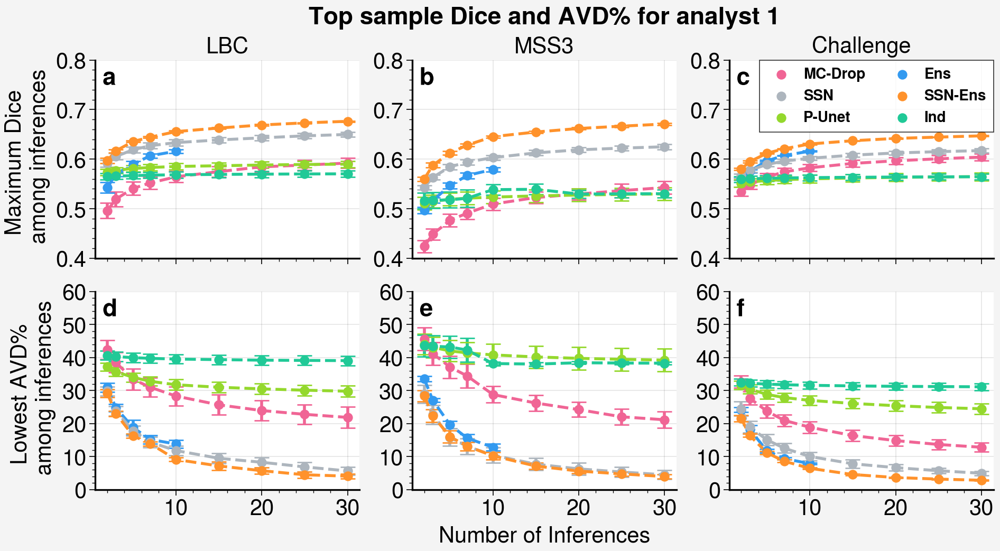

In [146]:
dice_and_avd_per_dataset_plot_num_inferences_plot('rater0_best_dice_dsorted', 'Maximum Dice \n among inferences', 'rater0_sample_best_avd', 'Lowest AVD% \n among inferences', 'Top sample Dice and AVD% for analyst 1', xlim=None, ylim1=(0.4, 0.8), ylim2=(0, 60))

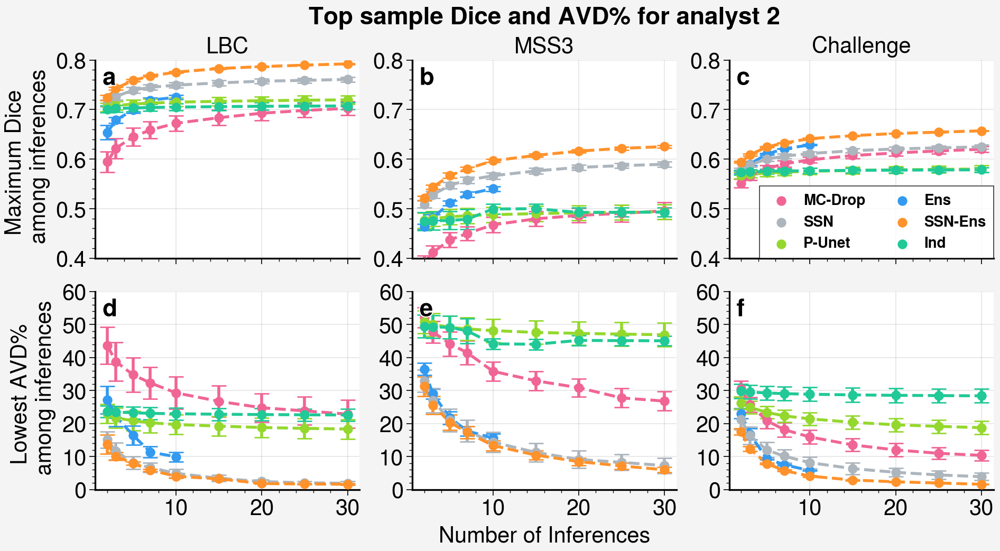

In [147]:
dice_and_avd_per_dataset_plot_num_inferences_plot('rater1_best_dice_dsorted', 'Maximum Dice \n among inferences', 'rater1_sample_best_avd', 'Lowest AVD% \n among inferences', 'Top sample Dice and AVD% for analyst 2', xlim=None, ylim1=(0.4, 0.8), ylim2=(0, 60))

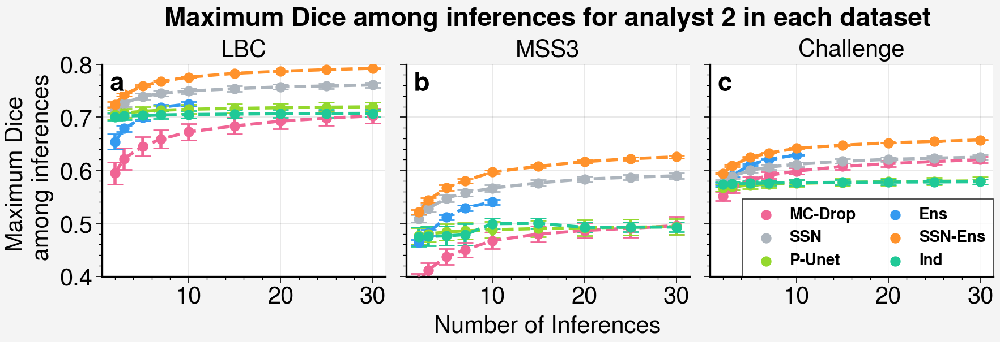

In [148]:
per_dataset_plot_num_inferences_plot("rater1_best_dice_dsorted", suptitle="Maximum Dice among inferences for analyst 2 in each dataset", ylabel="Maximum Dice \n among inferences", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.4, 0.8))

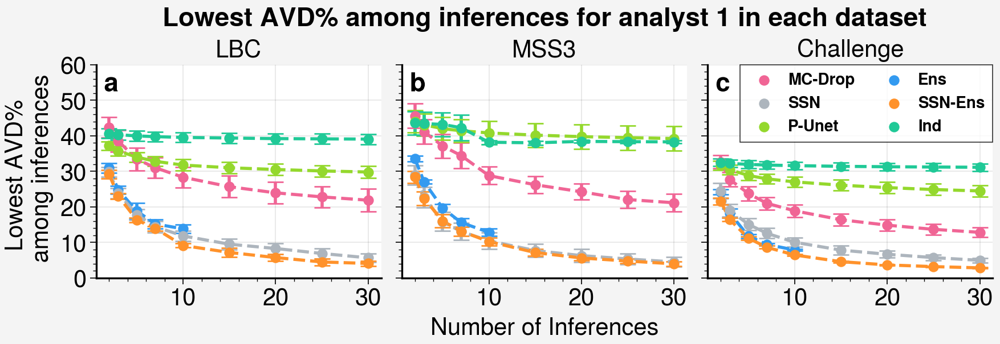

In [149]:
per_dataset_plot_num_inferences_plot("rater0_sample_best_avd", suptitle="Lowest AVD% among inferences for analyst 1 in each dataset", ylabel="Lowest AVD% \n among inferences", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0, 60))

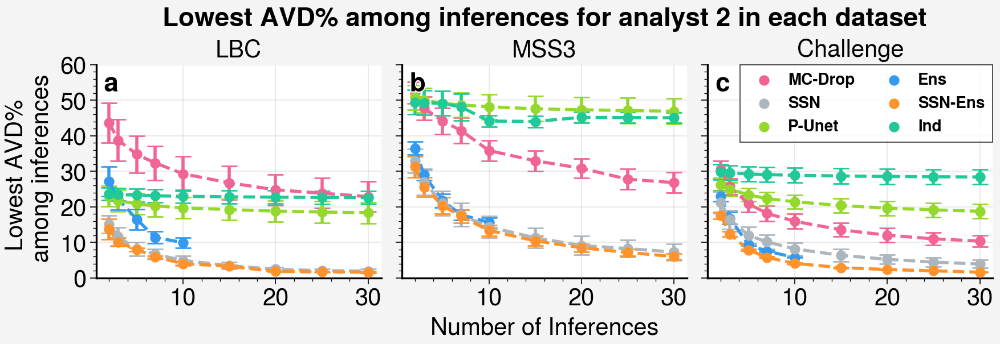

In [150]:
per_dataset_plot_num_inferences_plot("rater1_sample_best_avd", suptitle="Lowest AVD% among inferences for analyst 2 in each dataset", ylabel="Lowest AVD% \n among inferences", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0, 60))

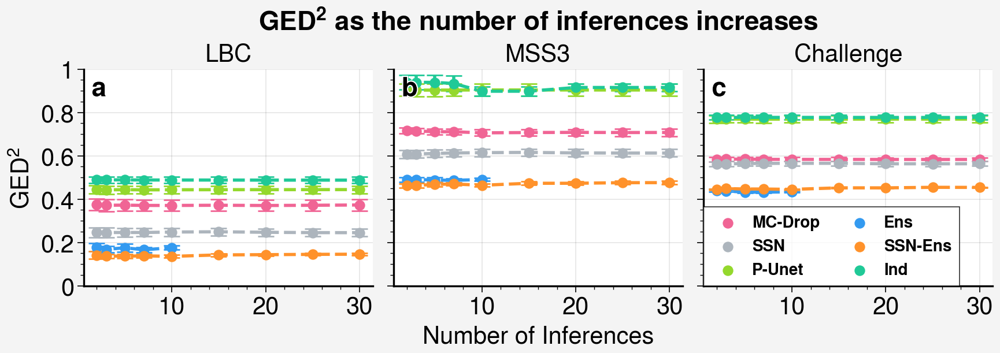

In [151]:
per_dataset_plot_num_inferences_plot("GED_dice_sorted", suptitle=r"$GED^2$ as the number of inferences increases", ylabel=r"$GED^2$", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0., 1))

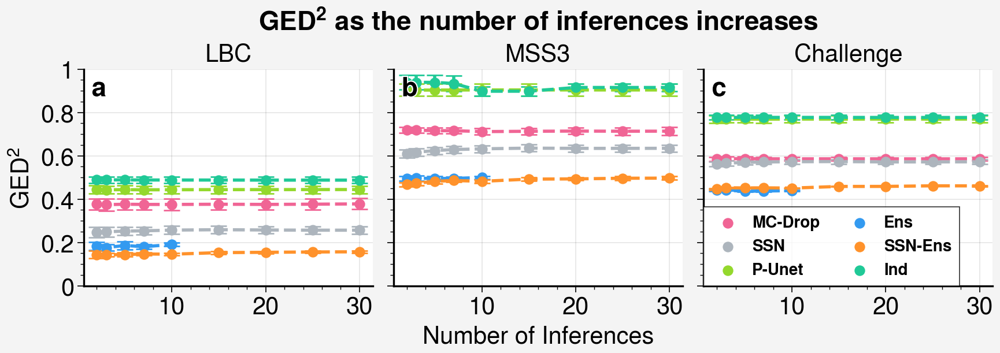

In [152]:
per_dataset_plot_num_inferences_plot("GED_vol_sorted", suptitle=r"$GED^2$ as the number of inferences increases", ylabel=r"$GED^2$", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0., 1))

### soft UEO based metrics

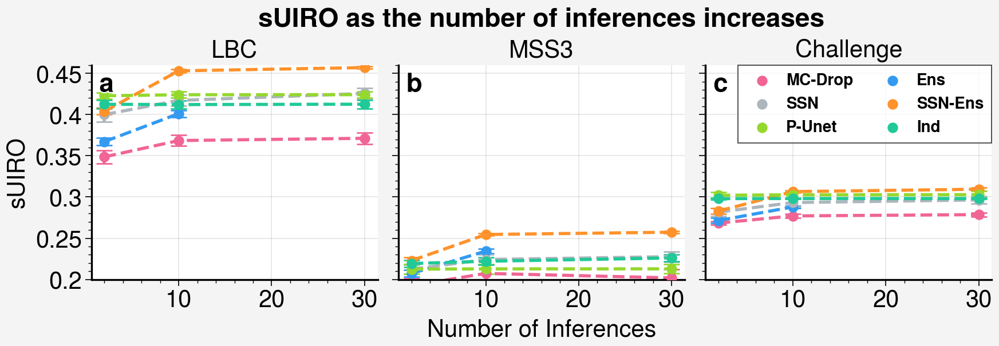

In [153]:
per_dataset_plot_num_inferences_plot("sUIRO", suptitle=r"sUIRO as the number of inferences increases", ylabel=r"sUIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.2, 0.46), limited_sample_nums=True)

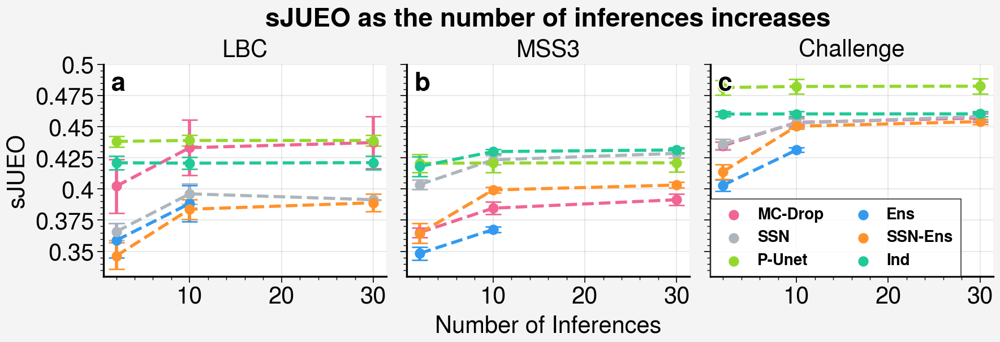

In [154]:
per_dataset_plot_num_inferences_plot("sJUEO", suptitle=r"sJUEO as the number of inferences increases", ylabel=r"sJUEO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.33, 0.50), limited_sample_nums=True)

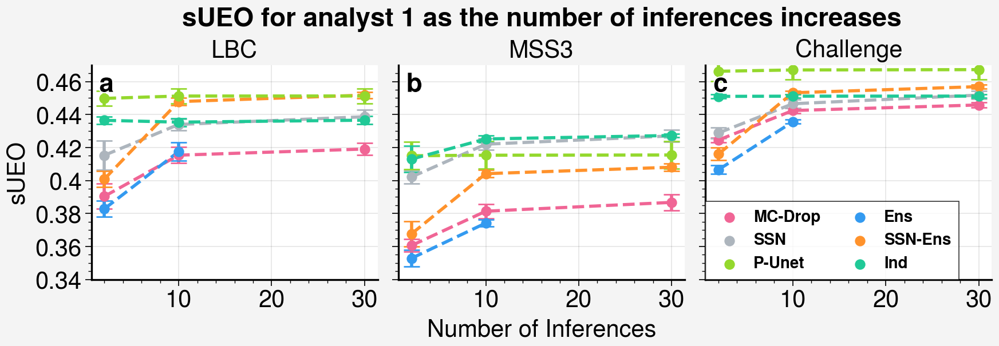

In [155]:
per_dataset_plot_num_inferences_plot("sUEO_r1", suptitle=r"sUEO for analyst 1 as the number of inferences increases", ylabel=r"sUEO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.34, 0.47), limited_sample_nums=True)

notice that we see that you need aleatoric uncertainty for modelling sUEO effectively, its that sample diversity that is actually important here

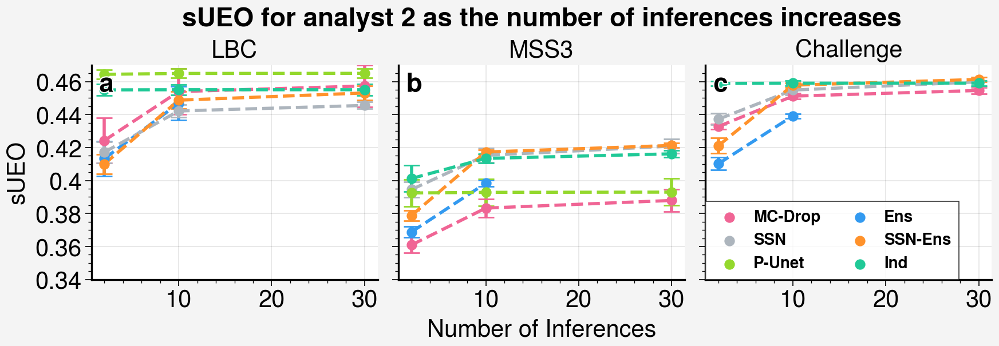

In [156]:
per_dataset_plot_num_inferences_plot("sUEO_r2", suptitle=r"sUEO for analyst 2 as the number of inferences increases", ylabel=r"sUEO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.34, 0.47), limited_sample_nums=True)

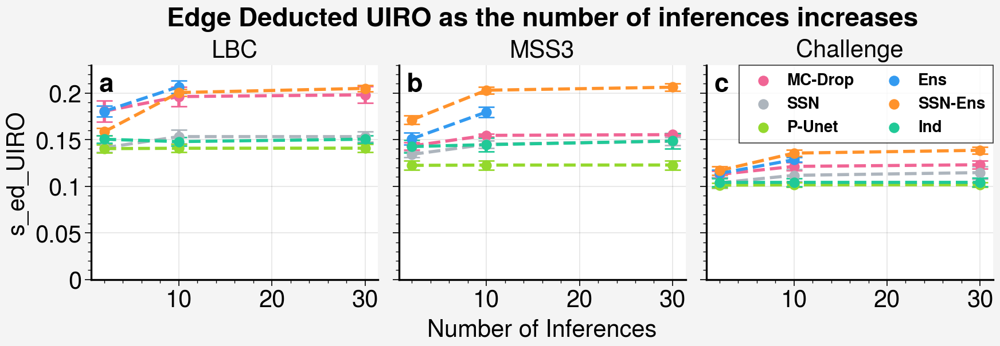

In [157]:
per_dataset_plot_num_inferences_plot("s_ed_UIRO", suptitle=r"Edge Deducted UIRO as the number of inferences increases", ylabel=r"s_ed_UIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0., 0.23), limited_sample_nums=True)


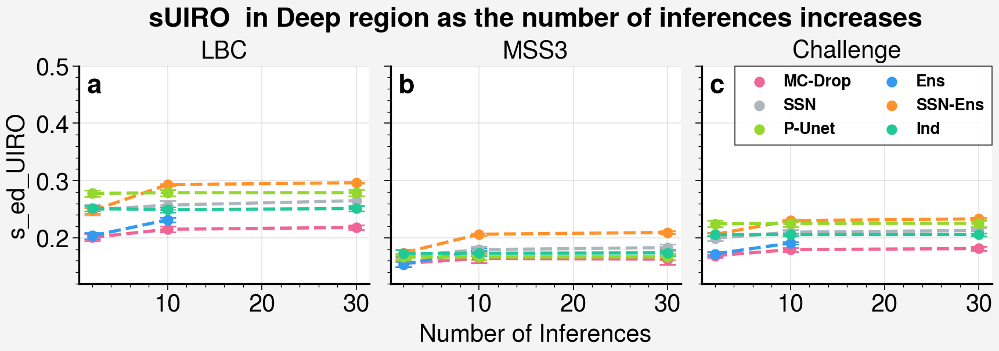

In [158]:
per_dataset_plot_num_inferences_plot("deep_sUIRO", suptitle=r"sUIRO  in Deep region as the number of inferences increases", ylabel=r"s_ed_UIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.12, 0.5), limited_sample_nums=True)


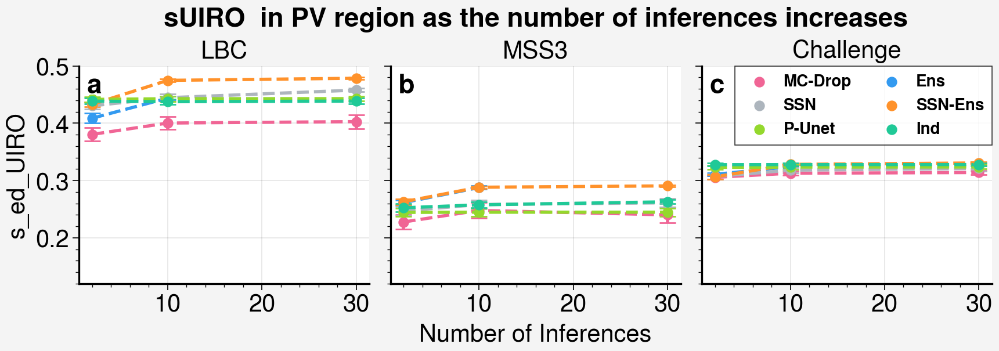

In [159]:
per_dataset_plot_num_inferences_plot("pv_sUIRO", suptitle=r"sUIRO  in PV region as the number of inferences increases", ylabel=r"s_ed_UIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.12, 0.5), limited_sample_nums=True)


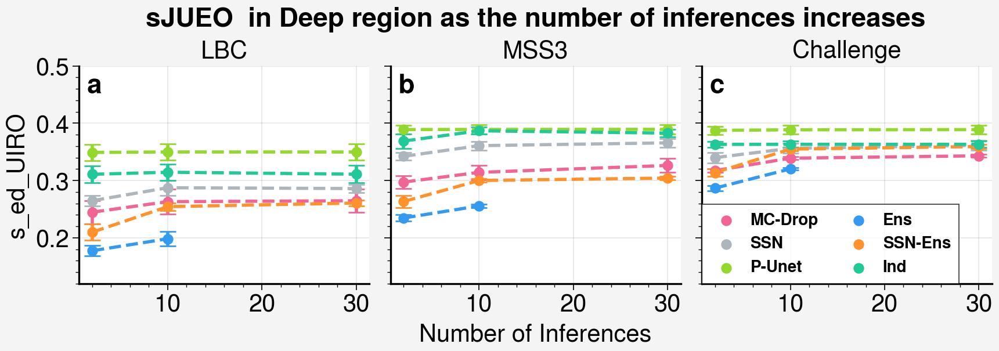

In [160]:
per_dataset_plot_num_inferences_plot("deep_sJUEO", suptitle=r"sJUEO  in Deep region as the number of inferences increases", ylabel=r"s_ed_UIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.12, 0.5), limited_sample_nums=True)


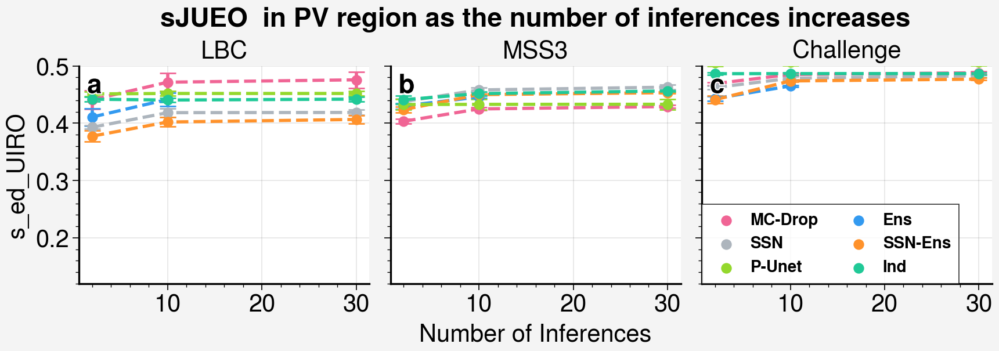

In [161]:
per_dataset_plot_num_inferences_plot("pv_sJUEO", suptitle=r"sJUEO  in PV region as the number of inferences increases", ylabel=r"s_ed_UIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.12, 0.5), limited_sample_nums=True)


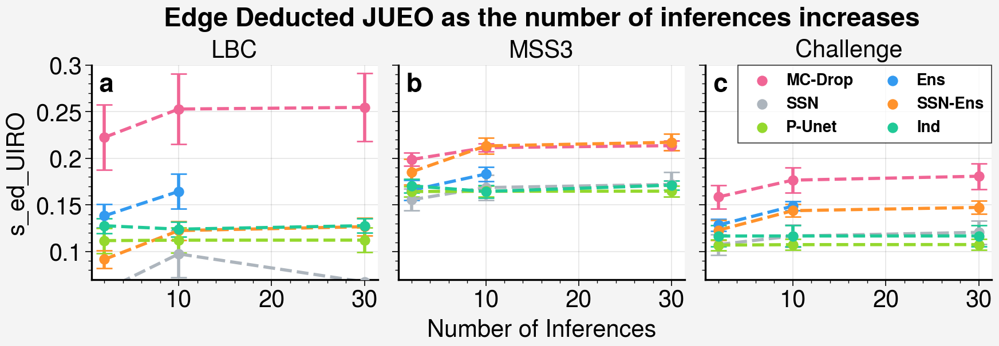

In [162]:
per_dataset_plot_num_inferences_plot("s_ed_JUEO", suptitle=r"Edge Deducted JUEO as the number of inferences increases", ylabel=r"s_ed_UIRO", titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=(0.07, 0.3), limited_sample_nums=True)


### UIRO JUEO plots

In [18]:
def UEO_at_point(df, get_max=True, at_value=None, max_value=0.7):
    thresholds = np.arange(0, max_value, 0.01)
    column_names = []
    threshold_means = []
    for t in thresholds:
        threshold_means.append(df.groupby(['uncertainty_type', 'cv_fold'])[f"UEO_{t:.2f}"].mean())
        column_names.append(f"UEO_{t:.2f}")
    column_names = np.array(column_names)
    threshold_means = pd.concat(threshold_means, axis=1)
    threshold_cv_means = threshold_means.groupby(['uncertainty_type']).mean()
    
    # find the value on the mean UEO curve that is closest to the target value
    threshold_cv_means = threshold_means.groupby(['uncertainty_type']).mean()
    closest_idx = (threshold_cv_means - at_value).abs().apply(np.argmin, axis=1)
    closest_value = threshold_cv_means.values[np.arange(len(threshold_cv_means)), closest_idx.values]
    
    result_df = pd.DataFrame(closest_idx)
    result_df['ueo_value'] = closest_value
    result_df['threshold'] = thresholds[closest_idx.values]
    
    return result_df

In [19]:
def plot_metric_for_all_thresholds_95(ax, df, metric, ylim=None, xlim=None, title="", ax_title="", marker_point=None, ylabel=None, num_samples=10, do_legend=False, line_at_yvalue=None):
    thresholds = np.arange(0, 0.7, 0.01)
    dfs = []
    # get a mean and conf interval for these curves.
    for tau in thresholds:
        dfs.append(mean_and_95_conf_over_cvfold(df, f"{metric}_t{tau:.2f}_ss{num_samples}"))
    tmetric_df = pd.concat(dfs, axis=1)
    
    mean_cols = [f"{metric}_t{tau:.2f}_ss{num_samples} mean" for tau in thresholds]
    conf_cols = [f"{metric}_t{tau:.2f}_ss{num_samples} 95%" for tau in thresholds]
    
    hs = []
    for key in SAMPLING_UNCERTAINTY_TYPES:
        mean = tmetric_df[mean_cols].loc[key].values
        conf = tmetric_df[conf_cols].loc[key].values
        # print(thresholds)
        # print(mean)
        h, = ax.plot(thresholds, mean, color=UNCERTAINTY_COLOURS[key], linewidth=2, label=key)
        hs.append(h)
        # sns.lineplot(x=thresholds, y=mean, label=key, color=UNCERTAINTY_COLOURS[key], ax=ax, linewidth=3)
        ax.fill_between(thresholds, mean - conf, mean + conf, alpha=0.3, color=UNCERTAINTY_COLOURS[key])
        
        # print(key, mean[-1])
        
        if marker_point is not None:
            # print("here")
            # print(marker_point.loc[key]['threshold'], marker_point.loc[key]['ueo_value'])
            ax.scatter(marker_point.loc[key]['threshold'], mean[int(marker_point.loc[key][0])], s=100, 
                       color=UNCERTAINTY_COLOURS[key], zorder=3, edgecolors='black')
            
        if line_at_yvalue:
            loc = np.argmin(np.abs(mean - line_at_yvalue))
            uncert_t = thresholds[loc]
            ax.plot([uncert_t, uncert_t], [0, line_at_yvalue], c='white', alpha=0.5, linewidth=3) # give a white background to help the dashed line stand out
            ax.plot([uncert_t, uncert_t], [0, line_at_yvalue], c=UNCERTAINTY_COLOURS[key], linestyle='--')
            
    
    if do_legend:
        ax.legend(ncols=2, prop={'size': 10, 'weight': 'bold'})

    ax.set_title(title, fontsize=15)
    
    ax.set_xlabel(r"Uncertainty threshold $\tau$")
    ax.set_ylabel(ylabel)
    
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)
    
    return hs

In [20]:
def per_dataset_plot_metric_threshold(metric, ylabel, suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=None, dfs=[lbc_df, mss3_df, challenge_df]):
    fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=True)
    axs = fig.subplots(nrows=1, ncols=3)
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel=r"Uncertainty Threshold $\tau$", ylabel=ylabel, grid=True, fontsize=15)
    
    for (df, title, ax) in zip(dfs, titles, axs):
        plot_metric_for_all_thresholds_95(
            ax, df, metric, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=title, ylabel=ylabel, do_legend = (title == 'Challenge')
        )
        
    
    for ax in axs:
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
        ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
        
    fig.save(f"plot_results/{suptitle}.pdf")

In [21]:
def per_dataset_double_plot_metric_threshold(metric1, ylabel1, metric2, ylabel2, suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=None, dfs=[lbc_df, mss3_df, challenge_df]):
    fig = pplt.figure(refwidth="20em", refheight="15em", spanx=True, sharex=True, sharey=False)
    axs = fig.subplots(nrows=2, ncols=3)
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)
    
    for (df, title, ax) in zip(dfs, titles, axs[0:3]):
        plot_metric_for_all_thresholds_95(
            ax, df, metric1, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=title, ylabel=ylabel1, do_legend = (title == 'Challenge')
        )
    for (df, title, ax) in zip(dfs, titles, axs[3:]):
        plot_metric_for_all_thresholds_95(
            ax, df, metric2, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=None, ylabel=ylabel2, do_legend = False
        )
        
    
    for ax in axs:
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
        ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
        
    fig.save(f"plot_results/{suptitle}.pdf")

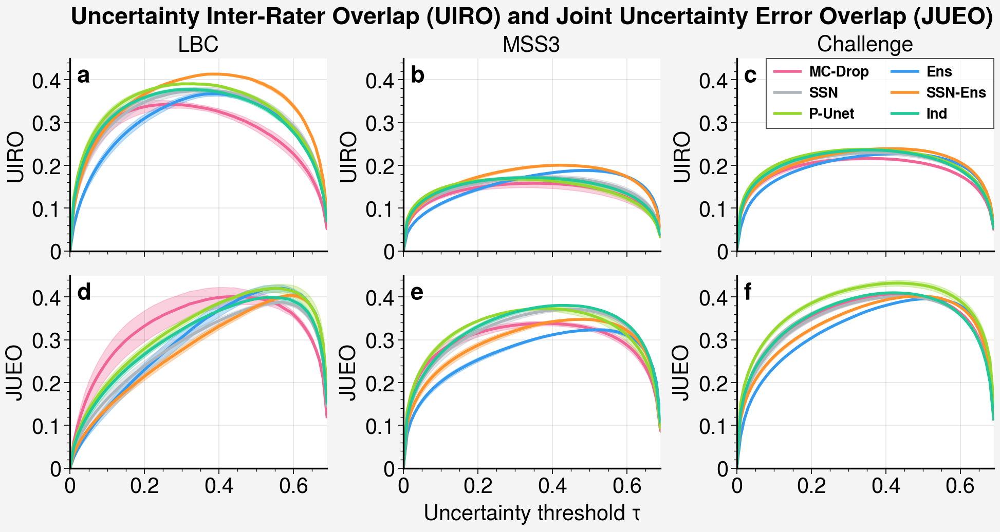

In [167]:
per_dataset_double_plot_metric_threshold("UIRO_curves", "UIRO", "JUEO_curves", "JUEO", "Uncertainty Inter-Rater Overlap (UIRO) and Joint Uncertainty Error Overlap (JUEO)", ylim=(0, 0.45))

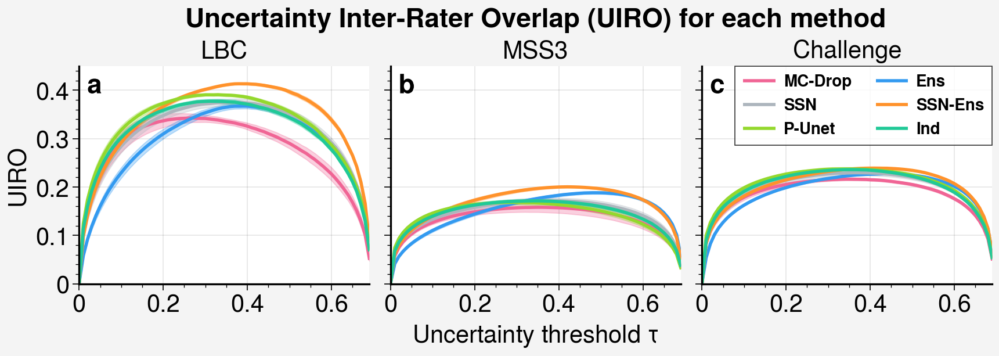

In [168]:
per_dataset_plot_metric_threshold("UIRO_curves", "UIRO", "Uncertainty Inter-Rater Overlap (UIRO) for each method", ylim=(0, 0.45))

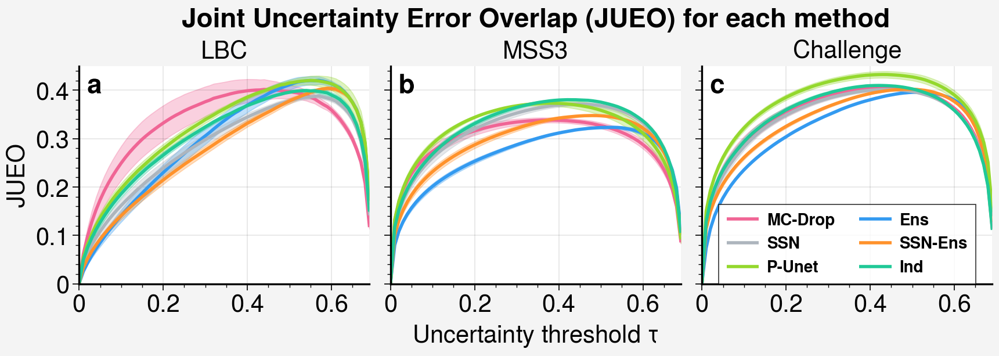

In [169]:
per_dataset_plot_metric_threshold("JUEO_curves", "JUEO", "Joint Uncertainty Error Overlap (JUEO) for each method", ylim=(0, 0.45))

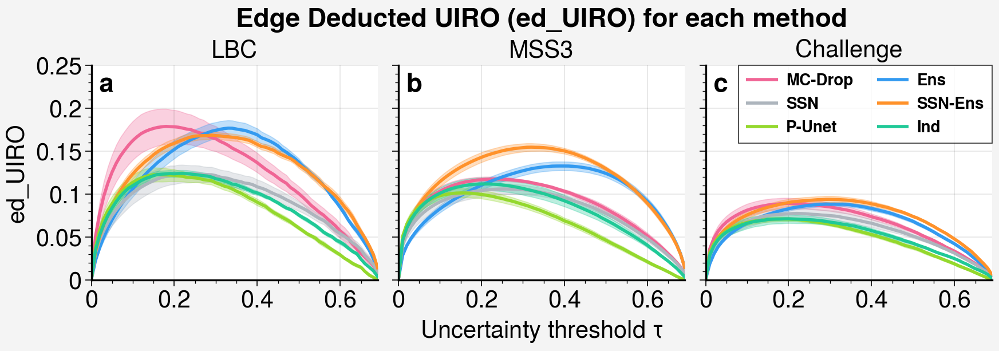

In [170]:
metric = "no_edge_uiro_curves"
title = "Edge Deducted UIRO (ed_UIRO) for each method"
ylim = (0, 0.25)
ylabel="ed_UIRO"
per_dataset_plot_metric_threshold(metric, ylabel, title, ylim=ylim)


### edge joint deducted ueo to be run after I saved it

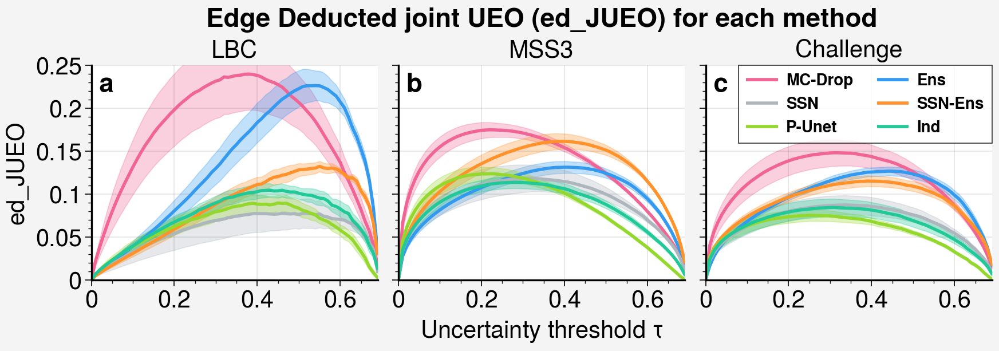

In [171]:
metric = "no_edge_jueo_curves"
title = "Edge Deducted joint UEO (ed_JUEO) for each method"
ylim = (0, 0.25)
ylabel="ed_JUEO"
per_dataset_plot_metric_threshold(metric, ylabel, title, ylim=ylim)

### connected component analysis

what do we see? Well we see that the mean uncertainty of lesions that only appear in one rater are much higher for SSN and that there is no overlap as the number of samples gets higher, however, we need to look at what is happening at thresholds as well. However, this is interesting.

TODO: do the rest of the connected component analysis...!!!!!

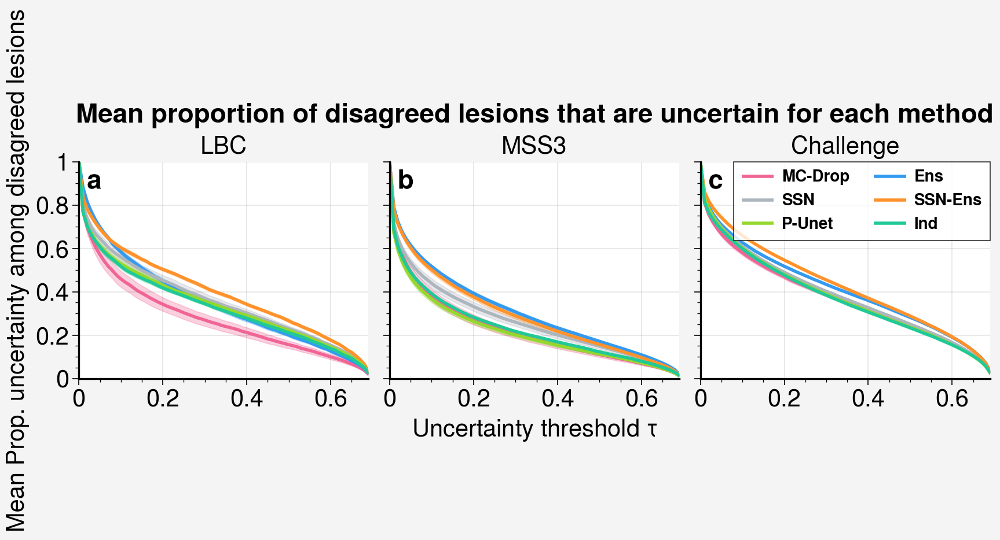

In [172]:
metric = "mean_ind_proportion_uncertain"
title = "Mean proportion of disagreed lesions that are uncertain for each method"
ylim = (0, 1)
ylabel="Mean Prop. uncertainty among disagreed lesions"
per_dataset_plot_metric_threshold(metric, ylabel, title, ylim=ylim)

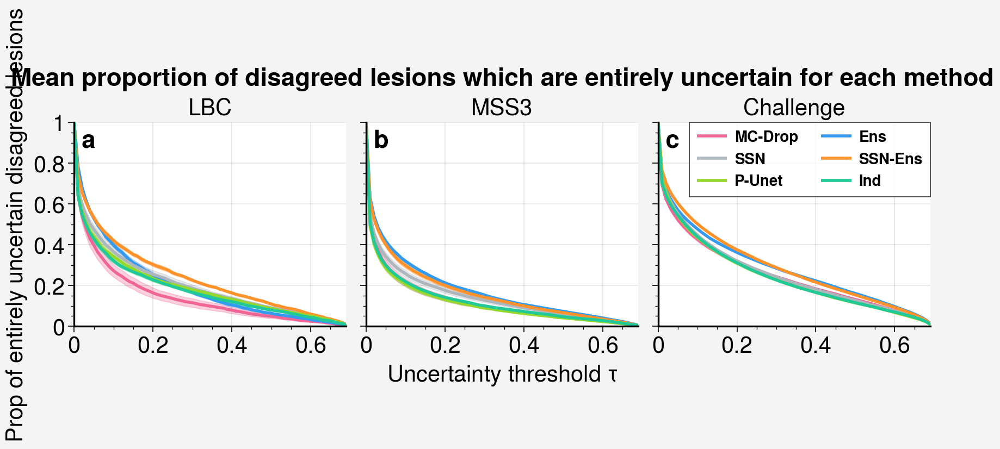

In [173]:
metric = "mean_ind_entirely_uncert"
title = "Mean proportion of disagreed lesions which are entirely uncertain for each method"
ylim = (0, 1)
ylabel="Prop of entirely uncertain disagreed lesions"
per_dataset_plot_metric_threshold(metric, ylabel, title, ylim=ylim)

### per individuals analysis

In [22]:
import matplotlib as mpl

In [23]:
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize, LogNorm

def individual_plot_metric_for_all_thresholds_95(ax, df, metric, ylim=None, xlim=None, title="", ylabel=None, num_samples=10, uncert_type='SSN-Ens'):
    thresholds = np.arange(0, 0.7, 0.01)
    dfs = []
    for tau in thresholds:
        dfs.append(mean_and_95_conf_over_cvfold(df, f"{metric}_t{tau:.2f}_ss{num_samples}", per_individual=True, individual_uncert_type=uncert_type))
    tmetric_df = pd.concat(dfs, axis=1)
    
    mean_gt_vols = df['mean_gt_vols_ss2'].iloc[0:65].values * 0.003
    # mean_gt_vols = np.log(mean_gt_vols)
    max_vol = max(mean_gt_vols)
    ordering = np.argsort(mean_gt_vols)
    
    mean_cols = [f"{metric}_t{tau:.2f}_ss{num_samples} mean" for tau in thresholds]
    conf_cols = [f"{metric}_t{tau:.2f}_ss{num_samples} 95%" for tau in thresholds]
    
    # Normalize mean_gt_vols for color mapping
    # norm = Normalize(vmin=min(mean_gt_vols), vmax=max(mean_gt_vols))
    norm = LogNorm(vmin=min(mean_gt_vols[mean_gt_vols > 0]), vmax=max(mean_gt_vols))
    cmap = plt.get_cmap('buda')  # Choose a colormap
    
    for idx in range(len(tmetric_df)):
        mean = tmetric_df[mean_cols].iloc[ordering[idx]].values
        conf = tmetric_df[conf_cols].iloc[ordering[idx]].values
        color = cmap(norm(mean_gt_vols[ordering[idx]]))
        ax.plot(thresholds, mean, linewidth=1, alpha=0.7, color=color)
        ax.fill_between(thresholds, mean - conf, mean + conf, alpha=0.1, color=color)
    
    ax.set_title(title, fontsize=15)
    # ax.set_xlabel("Uncertainty Threshold")
    ax.set_ylabel(ylabel)
    ax.set_ylim(ylim)
    
    mappable = ScalarMappable(norm=norm, cmap=cmap)
    mappable.set_array(mean_gt_vols)
    
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['bottom'].set_linewidth(1.2)
    ax.spines['left'].set_linewidth(1.2)
    
    return mappable


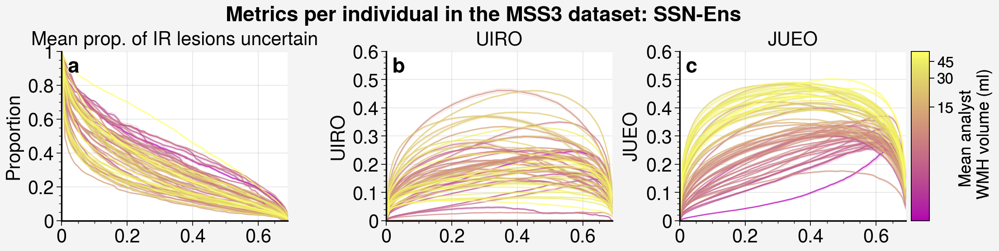

In [25]:
fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=False)
axs = fig.subplots(nrows=1, ncols=3)
uncert_type='SSN-Ens'
axs.format(abc=True, abcloc='ul', suptitle=f"Metrics per individual in the MSS3 dataset: {uncert_type}", xlabel=None, grid=True, fontsize=15)

individual_plot_metric_for_all_thresholds_95(axs[0], mss3_df, metric='mean_ind_proportion_uncertain', ylabel="Proportion", ylim=(0, 1), title="Mean prop. of IR lesions uncertain", uncert_type=uncert_type)
individual_plot_metric_for_all_thresholds_95(axs[1], mss3_df, metric='UIRO_curves', title="UIRO", ylabel="UIRO", ylim=(0, 0.6), uncert_type=uncert_type)
mappable = individual_plot_metric_for_all_thresholds_95(axs[2], mss3_df, metric='JUEO_curves', title="JUEO", ylabel="JUEO", ylim=(0, 0.6), uncert_type=uncert_type)
fig.colorbar(mappable, ax=axs[-1], label='Mean analyst \n WMH volume (ml)', ticks=15, ticklabelsize=12, labelsize=13)  # Add colorbar with label
fig.save(f"plot_results/Metrics per individual in the MSS3 dataset: {uncert_type}")

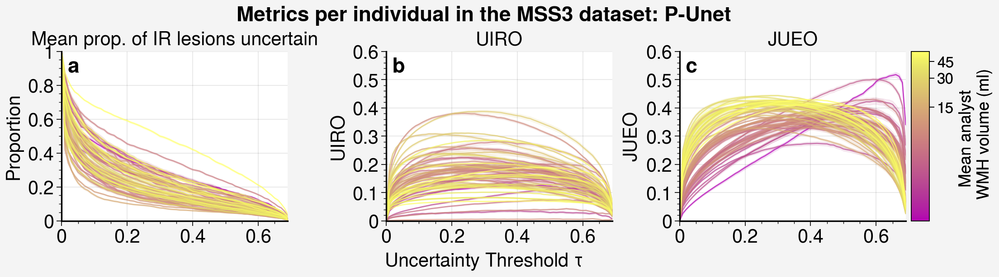

In [26]:
fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=False)
axs = fig.subplots(nrows=1, ncols=3)
uncert_type='P-Unet'
axs.format(abc=True, abcloc='ul', suptitle=f"Metrics per individual in the MSS3 dataset: {uncert_type}", xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)

individual_plot_metric_for_all_thresholds_95(axs[0], mss3_df, metric='mean_ind_proportion_uncertain', ylabel="Proportion", ylim=(0, 1), title="Mean prop. of IR lesions uncertain", uncert_type=uncert_type)
individual_plot_metric_for_all_thresholds_95(axs[1], mss3_df, metric='UIRO_curves', title="UIRO", ylabel="UIRO", ylim=(0, 0.6), uncert_type=uncert_type)
mappable = individual_plot_metric_for_all_thresholds_95(axs[2], mss3_df, metric='JUEO_curves', title="JUEO", ylabel="JUEO", ylim=(0, 0.6), uncert_type=uncert_type)
fig.colorbar(mappable, ax=axs[-1], label='Mean analyst \n WMH volume (ml)', ticks=15, ticklabelsize=12, labelsize=13)  # Add colorbar with label
fig.save(f"plot_results/Metrics per individual in the MSS3 dataset: {uncert_type}")

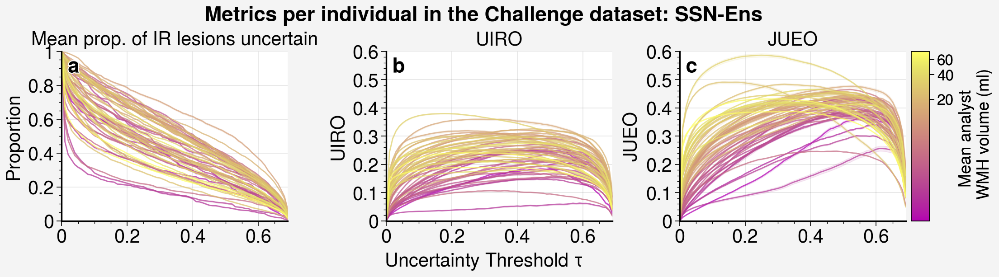

In [27]:
fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=False)
axs = fig.subplots(nrows=1, ncols=3)
uncert_type='SSN-Ens'
axs.format(abc=True, abcloc='ul', suptitle=f"Metrics per individual in the Challenge dataset: {uncert_type}", xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)

individual_plot_metric_for_all_thresholds_95(axs[0], challenge_df, metric='mean_ind_proportion_uncertain', ylabel="Proportion", ylim=(0, 1), title="Mean prop. of IR lesions uncertain", uncert_type=uncert_type)
individual_plot_metric_for_all_thresholds_95(axs[1], challenge_df, metric='UIRO_curves', title="UIRO", ylabel="UIRO", ylim=(0, 0.6), uncert_type=uncert_type)
mappable = individual_plot_metric_for_all_thresholds_95(axs[2], challenge_df, metric='JUEO_curves', title="JUEO", ylabel="JUEO", ylim=(0, 0.6), uncert_type=uncert_type)
fig.colorbar(mappable, ax=axs[-1], label='Mean analyst \n WMH volume (ml)', ticks=20, ticklabelsize=12, labelsize=13)  # Add colorbar with label
fig.save(f"plot_results/Metrics per individual in the Challenge dataset: {uncert_type}")

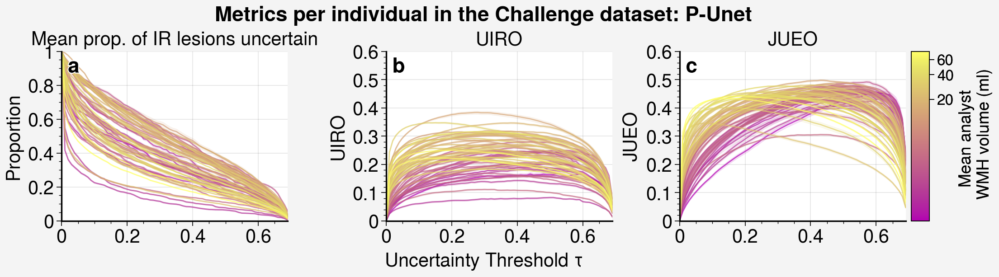

In [28]:
fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=False)
axs = fig.subplots(nrows=1, ncols=3)
uncert_type='P-Unet'
axs.format(abc=True, abcloc='ul', suptitle=f"Metrics per individual in the Challenge dataset: {uncert_type}", xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)

individual_plot_metric_for_all_thresholds_95(axs[0], challenge_df, metric='mean_ind_proportion_uncertain', ylabel="Proportion", ylim=(0, 1), title="Mean prop. of IR lesions uncertain", uncert_type=uncert_type)
individual_plot_metric_for_all_thresholds_95(axs[1], challenge_df, metric='UIRO_curves', title="UIRO", ylabel="UIRO", ylim=(0, 0.6), uncert_type=uncert_type)
mappable = individual_plot_metric_for_all_thresholds_95(axs[2], challenge_df, metric='JUEO_curves', title="JUEO", ylabel="JUEO", ylim=(0, 0.6), uncert_type=uncert_type)
fig.colorbar(mappable, ax=axs[-1], label='Mean analyst \n WMH volume (ml)', ticks=20, ticklabelsize=12, labelsize=13)  # Add colorbar with label
fig.save(f"plot_results/Metrics per individual in the Challenge dataset: {uncert_type}")

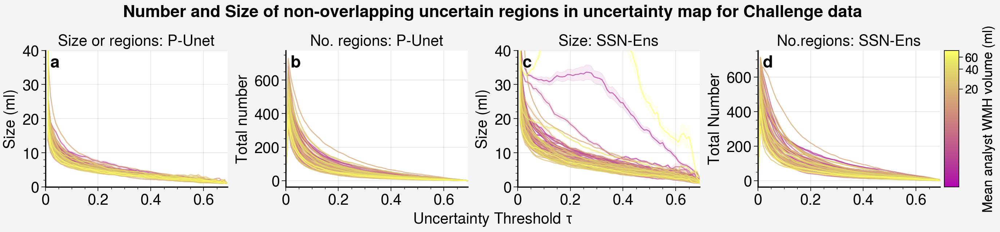

In [181]:
fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=False)
axs = fig.subplots(nrows=1, ncols=4)

axs.format(abc=True, abcloc='ul', suptitle=f"Number and Size of non-overlapping uncertain regions in uncertainty map for Challenge data", xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)

uncert_type='P-Unet'
individual_plot_metric_for_all_thresholds_95(axs[0], challenge_df, metric='all_mean_size_FP_uncertainty_ccs_all', ylim=(0, 40), ylabel=r"Size (ml)", title="Size or regions: "+uncert_type, uncert_type=uncert_type)
individual_plot_metric_for_all_thresholds_95(axs[1], challenge_df, metric='all_num_FP_uncertainty_ccs_all', title="No. regions: "+uncert_type, ylabel="Total number", uncert_type=uncert_type)
uncert_type='SSN-Ens'
individual_plot_metric_for_all_thresholds_95(axs[2], challenge_df, metric='all_mean_size_FP_uncertainty_ccs_all', ylim=(0, 40), ylabel=r"Size (ml)", title="Size: "+uncert_type, uncert_type=uncert_type)
mappable=individual_plot_metric_for_all_thresholds_95(axs[3], challenge_df, metric='all_num_FP_uncertainty_ccs_all', title="No.regions: "+uncert_type, ylabel="Total Number", uncert_type=uncert_type)
# mappable = individual_plot_metric_for_all_thresholds_95(axs[2], challenge_df, metric='JUEO_curves', title="JUEO", ylabel="JUEO", ylim=(0, 0.55), uncert_type=uncert_type)
fig.colorbar(mappable, ax=axs[-1], label=r'Mean analyst WMH volume (ml)', ticks=20, ticklabelsize=12, labelsize=13)
fig.save(f"plot_results/Number and Size of non-overlapping uncertain regions in uncertainty map for Challenge data")

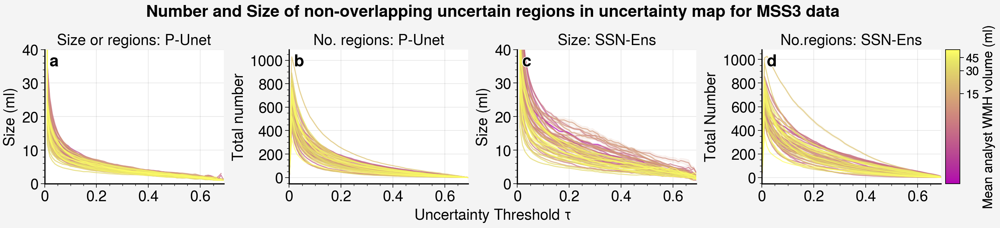

In [182]:
fig = pplt.figure(refwidth="20em", refheight="15em", span=True, share=False)
axs = fig.subplots(nrows=1, ncols=4)

axs.format(abc=True, abcloc='ul', suptitle=f"Number and Size of non-overlapping uncertain regions in uncertainty map for MSS3 data", xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)

uncert_type='P-Unet'
individual_plot_metric_for_all_thresholds_95(axs[0], mss3_df, metric='all_mean_size_FP_uncertainty_ccs_all', ylim=(0, 40), ylabel=r"Size (ml)", title="Size or regions: "+uncert_type, uncert_type=uncert_type)
individual_plot_metric_for_all_thresholds_95(axs[1], mss3_df, metric='all_num_FP_uncertainty_ccs_all', title="No. regions: "+uncert_type, ylabel="Total number", uncert_type=uncert_type)
uncert_type='SSN-Ens'
individual_plot_metric_for_all_thresholds_95(axs[2], mss3_df, metric='all_mean_size_FP_uncertainty_ccs_all', ylim=(0, 40), ylabel=r"Size (ml)", title="Size: "+uncert_type, uncert_type=uncert_type)
mappable=individual_plot_metric_for_all_thresholds_95(axs[3], mss3_df, metric='all_num_FP_uncertainty_ccs_all', title="No.regions: "+uncert_type, ylabel="Total Number", uncert_type=uncert_type)
# mappable = individual_plot_metric_for_all_thresholds_95(axs[2], challenge_df, metric='JUEO_curves', title="JUEO", ylabel="JUEO", ylim=(0, 0.55), uncert_type=uncert_type)
fig.colorbar(mappable, ax=axs[-1], label=r'Mean analyst WMH volume (ml)', ticks=15, ticklabelsize=12, labelsize=13)
fig.save(f"plot_results/Number and Size of non-overlapping uncertain regions in uncertainty map for MSS3 data")

### proportion uncertain across the different regions for each method, in the PV and Deep regions and number of connected components with no overlap in the rater maps and their size

In [194]:
voxelwise_folder = "/home/s2208943/ipdis/results/pixel_wise_and_cc_inter_rater_stats/"
voxelwise_filenames = os.listdir(voxelwise_folder)

In [127]:
def load_voxelwise_data(folder, filenames, keys_match, dataset_name="mss3"):
    dfs = []
    for fn in tqdm(natsorted(filenames)):
        if dataset_name not in fn:
            continue
        arr = np.load(os.path.join(folder, fn))
        if "_evid_" in fn:
            uncertainty_type = "Evid"
        elif "_deterministic_" in fn:
            uncertainty_type = "SEnt"
        elif "_ind_" in fn:
            uncertainty_type = "Ind"
        elif "_punet_" in fn:
            uncertainty_type = "P-Unet"
        elif "_ens" in fn and "ssn" not in fn:
            uncertainty_type = "Ens"
        elif "_mc_drop" in fn:
            uncertainty_type = "MC-Drop"
        elif "_ssn_ens_" in fn:
            uncertainty_type = "SSN-Ens"
        elif "_ssn_" in fn and "_ens" not in fn:
            uncertainty_type = "SSN"
        else:
            print("uncertainty type unclear for ", fn)
            continue
            
        cv_fold = fn.split("_")[-2][-1]
        num_samples = fn.split("_")[-1][2:4]
        if num_samples[-1] == '.':
            num_samples = num_samples[:-1]
        
        df = {}
        for key in arr.keys():
            for match in keys_match:
                if match in key:
                    values = arr[key]
                    df[key] = [values[~np.isnan(values)].mean()]
        
        # for key, value in df.items():
        #     print(key, " : ", value.shape) 
        df = pd.DataFrame(df)
        
        # configure df
        df = df.rename(columns = {key:key + f"_ss{num_samples}" for key in df.keys() if key.split("_")[-1][0:2] != "ss" and "Unnamed" not in key})
        df['uncertainty_type'] = [uncertainty_type for _ in range(len(df))]
        df['cv_fold'] = [cv_fold for _ in range(len(df))]
        
        if int(num_samples) > 10 and uncertainty_type == "Ens":
            continue # we only have ensemble up to size 10, but the results got copied into values greater than 10 somehow..

        dfs.append(df)
    
    return pd.concat(dfs, ignore_index=False)
    

In [129]:
mss3_data_df = load_voxelwise_data(voxelwise_folder, voxelwise_filenames, keys_match=['prop_uncert_all'], dataset_name="mss3")
lbc_data_df = load_voxelwise_data(voxelwise_folder, voxelwise_filenames, keys_match=['prop_uncert_all'], dataset_name="lbc")
challenge_data_df = load_voxelwise_data(voxelwise_folder, voxelwise_filenames, keys_match=['prop_uncert_all'], dataset_name="challenge")

  0%|                                                                                                                                                                                                                 | 0/286 [00:00<?, ?it/s]/tmp/ipykernel_2685852/3491566132.py:37: RuntimeWarning: Mean of empty slice.
  df[key] = [values[~np.isnan(values)].mean()]
/home/s2208943/miniconda3/envs/wmh/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
 36%|███████████████████████████████████████████████████████████████████████▎                                                                                                                              | 103/286 [00:00<00:00, 484.08it/s]/tmp/ipykernel_2685852/3491566132.py:37: RuntimeWarning: Mean of empty slice.
  df[key] = [values[~np.isnan(values)].mean()]
/home/s2208943/miniconda3/envs/wmh/lib/python3.10/site-packages/numpy/core/_methods.py:129: R

In [134]:
def prop_cc_uncert_per_IOU_type(suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], xlim=None, ylim=None, region_kind='all'):
    fig = pplt.figure(refwidth="15em", span=True, share=True)
    axs = fig.subplots(nrows=3, ncols=4)
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel=r"Uncertainty Threshold $\tau$", ylabel=ylabel, grid=True)
    
    count = 0
    for (df, title) in zip([lbc_data_df, mss3_data_df, challenge_data_df], titles):
        for IOU_kind in ['none', 'low', 'high', 'exact']:
            metric = f"{region_kind}_{IOU_kind}_prop_uncert_all"
            hs = plot_metric_for_all_thresholds_95(
                axs[count], df, metric, 
                marker_point=None,
                ylim=ylim, xlim=xlim, title=f"{title}: {region_kind_name_map[region_kind]}: {IOU_kind_name_map[IOU_kind]}", 
                ylabel="Mean proportion of cc volume that is uncertain", do_legend = False, line_at_yvalue=0.4
            )
            axs[count].axhline(y=0.4, color='black', linestyle='--', alpha=0.4)
            count += 1
    
    for ax in axs:
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
        ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
        
    fig.legend(hs, ncols=3, center=True, frame=False, loc='b')
    fig.save(f"plot_results/prop_cc_uncert_per_IOU_type_{region_kind}.pdf")

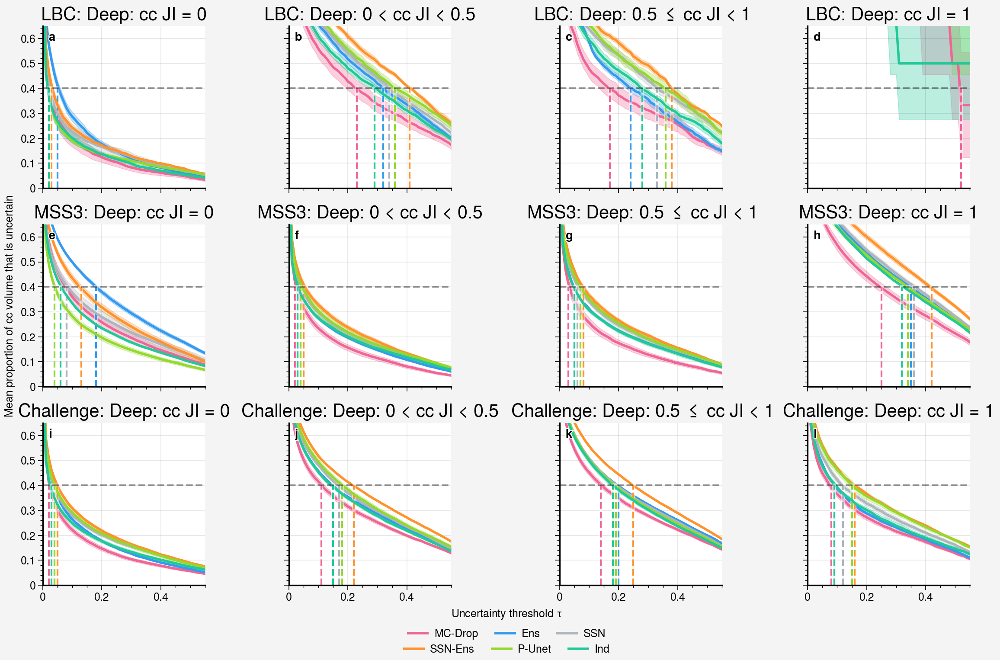

In [135]:
prop_cc_uncert_per_IOU_type(region_kind='deep', xlim=(0, 0.55), ylim=(0, 0.65))

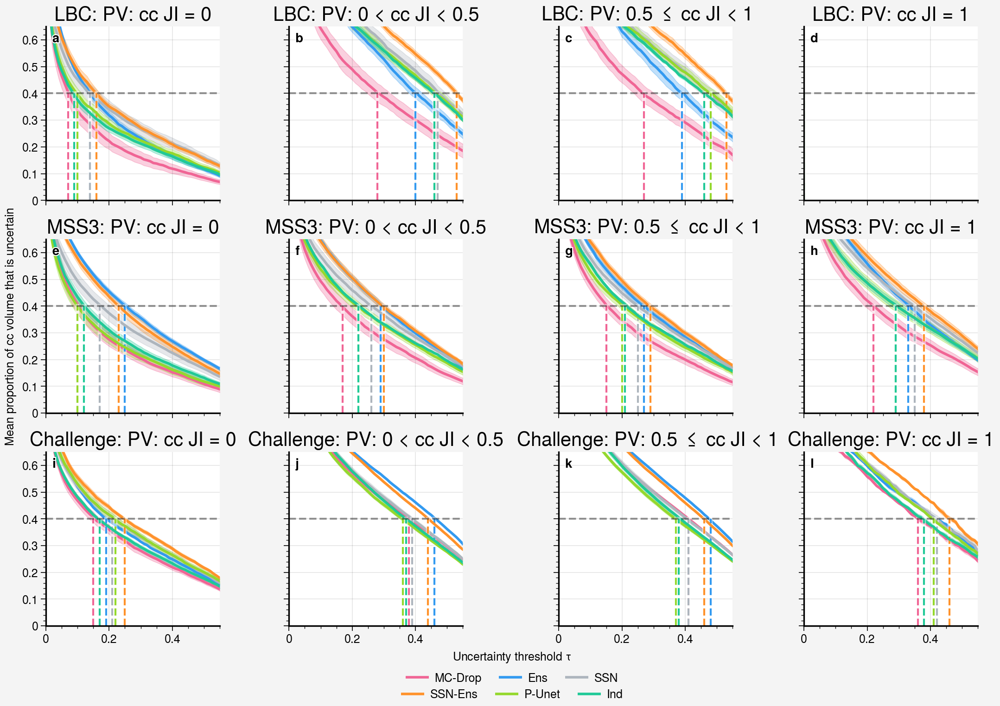

In [195]:
prop_cc_uncert_per_IOU_type(region_kind='pv', xlim=(0, 0.55), ylim=(0, 0.65))

### Notes on number and size of uncertain regions with no overlap

We want (for number and arguably for size) lower values here. P-Unet does well. Plain Ensemble is a poor outlier here. Ind and P-Unet, which are limited in their expressiveness, perform the best. they are
more conservative in their uncertainty estimates. Despite having worse GeD and top dice and avd, the Ind method is not the best here. P-Unet is better, having some spatial modelling of uncertainty is important even when desiring a more conservaive model. Ind performs worse and that is kinda wierd, you would expect it, as the least expressive, to introduce the least number of pointless lesions, but it isn't the case.

In [201]:
def per_dataset_no_overlap_uncert_ccs(suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], dfs=[lbc_df, mss3_df, challenge_df], region_kind='all'):
    fig = pplt.figure(refwidth="20em", refheight="15em", span=False, share=True)
    axs = fig.subplots(nrows=2, ncols=3)
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)
    
    count = 0
    ylim = (0, 400)
    xlim = (0.05, 0.65)
    metric=f"{region_kind}_num_FP_uncertainty_ccs_all"
    for (df, title) in zip(dfs, titles):
        plot_metric_for_all_thresholds_95(
            axs[count], df, metric, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=f"{title} {region_kind_name_map[region_kind]}", ylabel="Number of ccs.", do_legend = False
        )
        count += 1
    metric=f"{region_kind}_mean_size_FP_uncertainty_ccs_all"
    ylim = (0, 40)
    xlim = (0.01, 0.65)
    for df in dfs:
        hs = plot_metric_for_all_thresholds_95(
            axs[count], df, metric, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=None, ylabel=r"Size of ccs. (ml)", do_legend = False
        )
        count += 1
    
    for ax in axs:
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
        ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
        
    fig.legend(hs, ncols=3, center=True, frame=False, loc='b', prop={'size': 11, 'weight': 'bold'})
    fig.save(f"plot_results/per_dataset_no_overlap_uncert_ccs_{region_kind}.pdf")

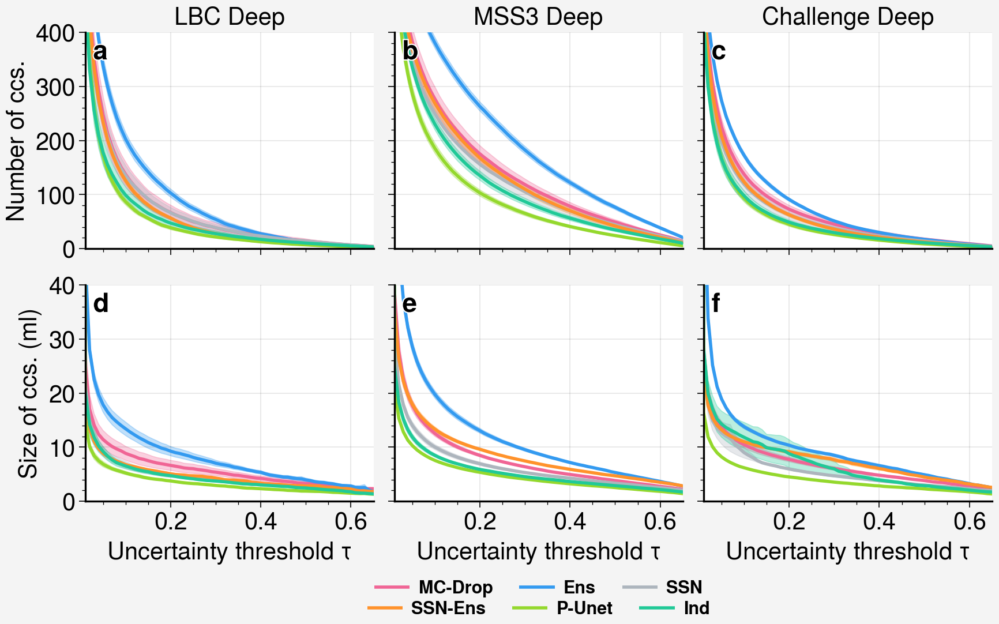

In [202]:
per_dataset_no_overlap_uncert_ccs(region_kind='deep')

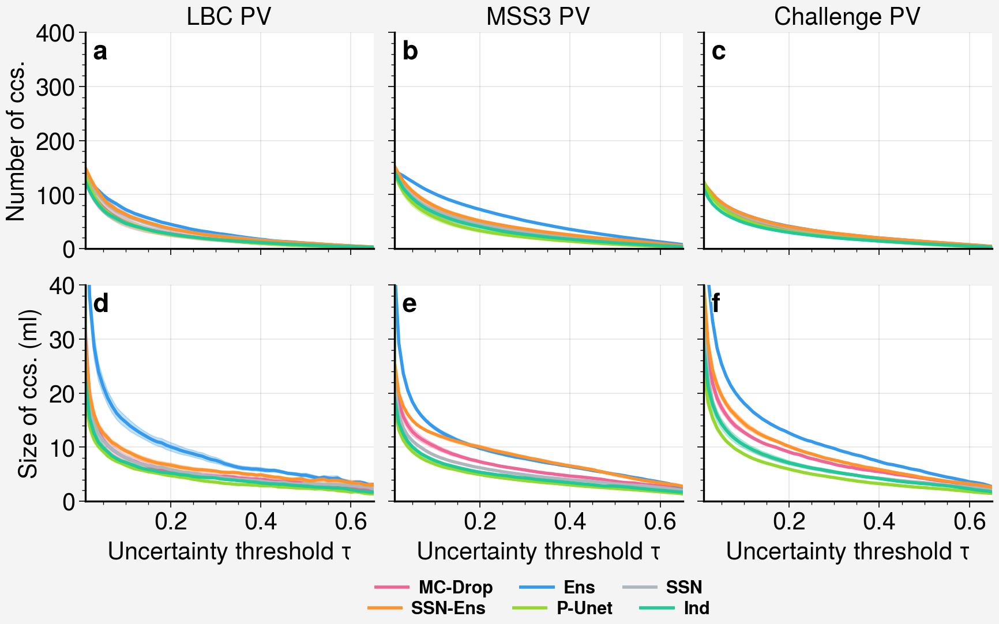

In [203]:
per_dataset_no_overlap_uncert_ccs(region_kind='pv')

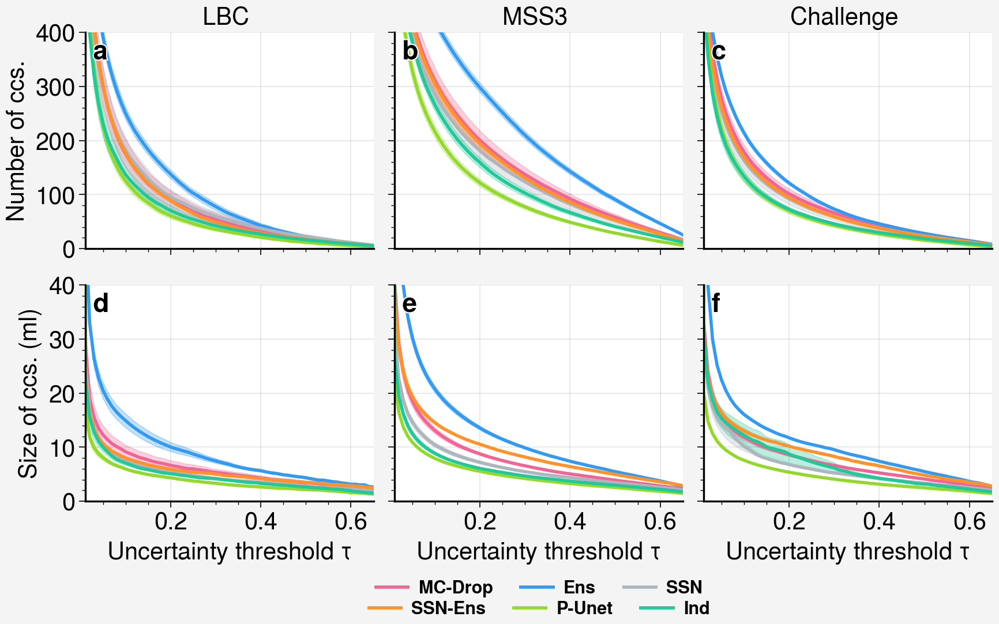

In [204]:
per_dataset_no_overlap_uncert_ccs(region_kind='all')

In [205]:
def per_dataset_no_overlap_uncert_ccs_num_uncert(suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], dfs=[lbc_df, mss3_df, challenge_df], region_kind='all'):
    fig = pplt.figure(refwidth="20em", refheight="15em", spanx=True, sharex=True)
    axs = fig.subplots(nrows=1, ncols=3)
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)
    
    count = 0
    ylim = (0, 400)
    xlim = (0.05, 0.65)
    metric=f"{region_kind}_num_FP_uncertainty_ccs_all"
    for (df, title) in zip(dfs, titles):
        plot_metric_for_all_thresholds_95(
            axs[count], df, metric, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=f"{title} {region_kind_name_map[region_kind]}", ylabel="Number of ccs.", do_legend = (title == "Challenge")
        )
        count += 1
    
    for ax in axs:
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
        ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
        
    fig.save(f"plot_results/per_dataset_no_overlap_num_ccs{region_kind}.pdf")

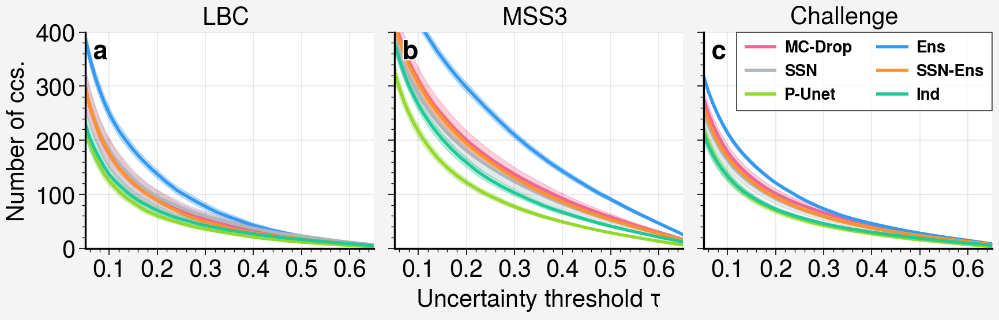

In [206]:
per_dataset_no_overlap_uncert_ccs_num_uncert(region_kind='all')

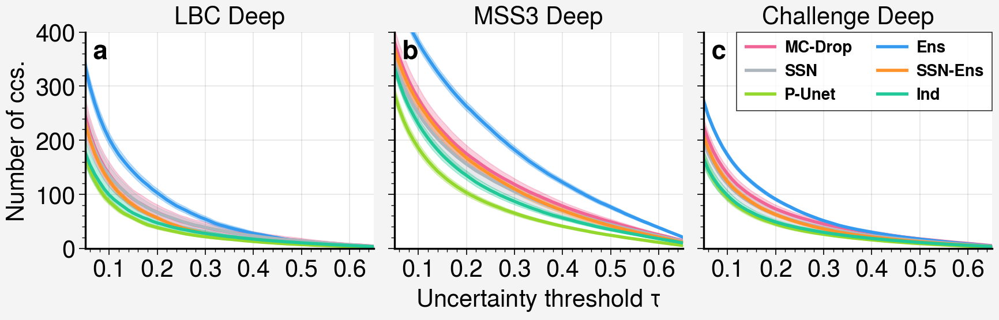

In [207]:
per_dataset_no_overlap_uncert_ccs_num_uncert(region_kind='deep')

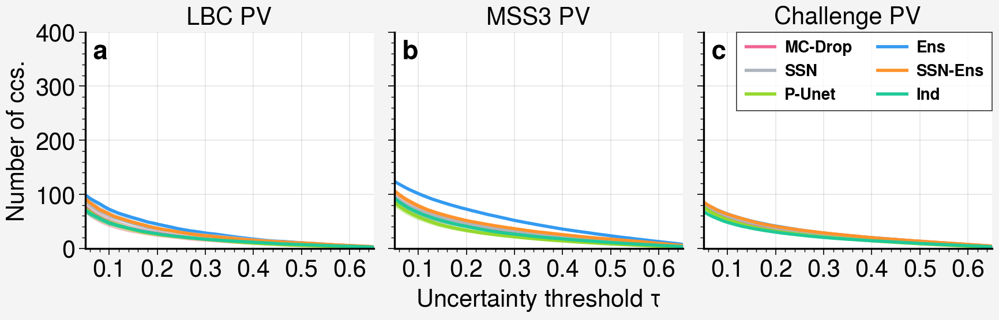

In [208]:
per_dataset_no_overlap_uncert_ccs_num_uncert(region_kind='pv')

In [209]:
def per_dataset_no_overlap_uncert_ccs_size_uncert(suptitle=None, titles=['LBC', 'MSS3', 'Challenge'], dfs=[lbc_df, mss3_df, challenge_df], region_kind='all'):
    fig = pplt.figure(refwidth="20em", refheight="15em", spanx=True, sharex=True)
    axs = fig.subplots(nrows=1, ncols=3)
    axs.format(abc=True, abcloc='ul', suptitle=suptitle, xlabel=r"Uncertainty Threshold $\tau$", grid=True, fontsize=15)
    
    count = 0
    metric=f"{region_kind}_mean_size_FP_uncertainty_ccs_all"
    ylim = (0, 40)
    xlim = (0.01, 0.65)
    for (df, title) in zip(dfs, titles):
        plot_metric_for_all_thresholds_95(
            axs[count], df, metric, 
            marker_point=None,
            ylim=ylim, xlim=xlim, title=f"{title} {region_kind_name_map[region_kind]}", ylabel="Size of ccs. (ml)", do_legend = (title == "Challenge")
        )
        count += 1
    
    for ax in axs:
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
        ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
        
    fig.save(f"plot_results/per_dataset_no_overlap_size_ccs{region_kind}.pdf")

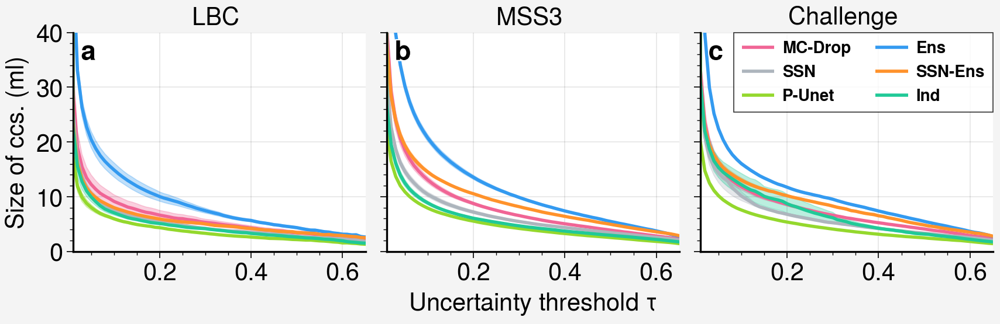

In [210]:
per_dataset_no_overlap_uncert_ccs_size_uncert(region_kind='all')

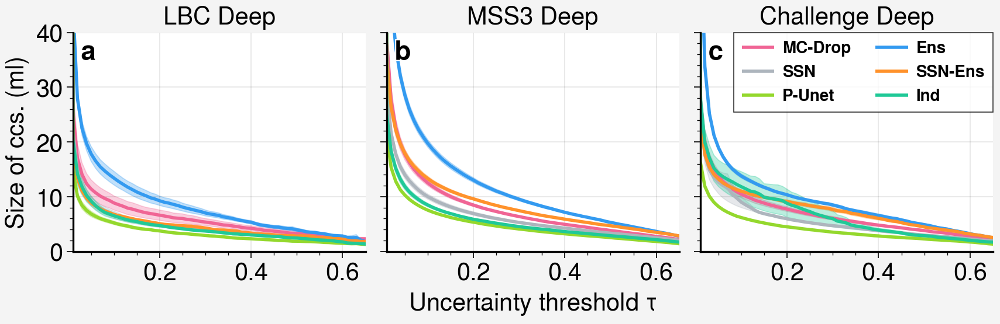

In [211]:
per_dataset_no_overlap_uncert_ccs_size_uncert(region_kind='deep')

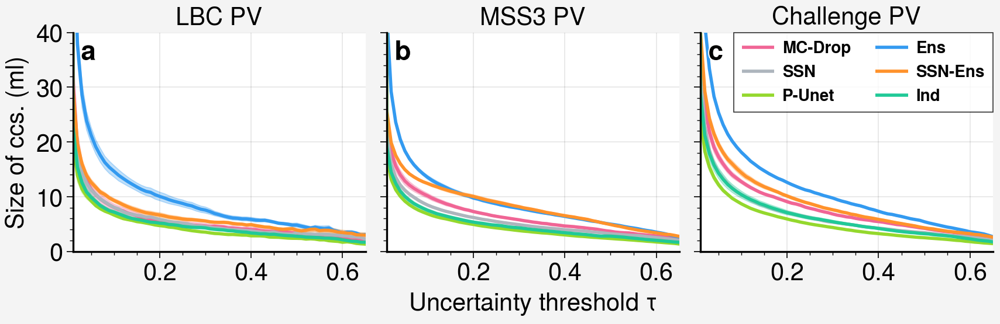

In [212]:
per_dataset_no_overlap_uncert_ccs_size_uncert(region_kind='pv')

### sample volumes and skew per individual plots
also look at the skew of each distribution. Nice.

These should be like the existing ones that I have in the paper

In [221]:
def sample_div_plot(df, uncertainty_type, merge_folds=False, doxlabel=True, num_samples=10, rater=None, ylim=None, df_name="df_name"):  
    fig = pplt.figure(refwidth=10, refheight=2)
    ax = fig.subplots(nrows=1, ncols=1)
    ax.format(fontsize=15)
    
    raters = [rater] if rater != None else [0, 1]
    boxes = []
    for rater, c in zip(raters, ['yellow4', 'grape4']):
        model_df = df[df['uncertainty_type'] == uncertainty_type]

        model_df = model_df.copy()#['mean_gt_vols_ss2']
        reps = model_df['mean_gt_vols_ss2'].values[0:65]
        uniques = np.unique(model_df['mean_gt_vols_ss2'].values)
        uniques = uniques[~np.isnan(uniques)]
        length = len(uniques)
        print(length)
        model_df['mean_gt_vols_ss2'] = np.concatenate([model_df['mean_gt_vols_ss2'].values[0:length] for _ in range(len(model_df)//length)])

        # vols = model_df['mean_gt_vols_ss2'][0:length]

        model_df = model_df[['mean_gt_vols_ss2', 'cv_fold'] + [f'vds_rater{rater}_sample{i}_ss{num_samples}' for i in range(num_samples)]]
                   #  'sample_0_vd',
                   # 'sample_1_vd', 'sample_2_vd', 'sample_3_vd', 'sample_4_vd',
                   # 'sample_5_vd', 'sample_6_vd', 'sample_7_vd', 'sample_8_vd',
                   # 'sample_9_vd']]

        if merge_folds:
            model_df = model_df.groupby(['mean_gt_vols_ss2', 'cv_fold']).mean().groupby(['mean_gt_vols_ss2']).mean()
            vols = model_df.index
        else:
            vols = model_df['mean_gt_vols_ss2']
            model_df = model_df.drop(columns=['mean_gt_vols_ss2', 'cv_fold'], inplace=False)

        values = model_df.values
        # print(values)
        # values = values[~np.isnan(values)]
        sorted_vols_idx = np.argsort(vols)
        values = values[sorted_vols_idx]
        length = len(values)
        values = values.T
        
        print(len(values))
        print(len(np.arange(0, len(values), 1) + rater - 0.5))

        # print(values)
        # make the raters -0.25, +0.25 either side of the x line
        box = ax.boxplot(y=values, positions=np.arange(0, length, 1) * 2 + rater * 0.5 - 0.25, fill=True, fillcolor=c, fliercolors=c, markersize=3, linewidth=1.5, zorder=2)
        boxes.append(box)
        print(list(box.keys()))
        for item in ['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']:
            plt.setp(box[item], color=c)
        for median in box['medians']:
            median.set_color('black')
            median.set_linewidth(1)

            
    # figure formatting
    if len(boxes) > 1:
        ax.legend([boxes[0]["boxes"][0], boxes[1]["boxes"][0]], ['analyst 1', 'analyst 2'], linewidth=5, prop={'size': 12, 'weight': 'bold'})
    ax.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False) # labels along the bottom edge are off
    plt.ylabel(f"Volume Difference %")
    # plt.yscale('log')
    ax.set_ylim(ylim)
    if doxlabel:
        plt.xlabel("Individuals, sorted by WMH Volume")
    
    # plot red line at volume is 0
    ax.axhline(y=0, color='red6', zorder=3)
    
    # axes style
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['bottom'].set_linewidth(1.2)  # Thicker bottom spine
    ax.spines['left'].set_linewidth(1.2)  # Thicker left spine
    
    ax.text(x=0.5, y=0.95, s=uncertainty_type, ha='center', va='top', transform=ax.transAxes, fontsize=15, fontweight='bold')
    
    
    
    fig.save(f"plot_results/sample_div_plot_{uncertainty_type}_{df_name}.pdf")

61
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']
61
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']


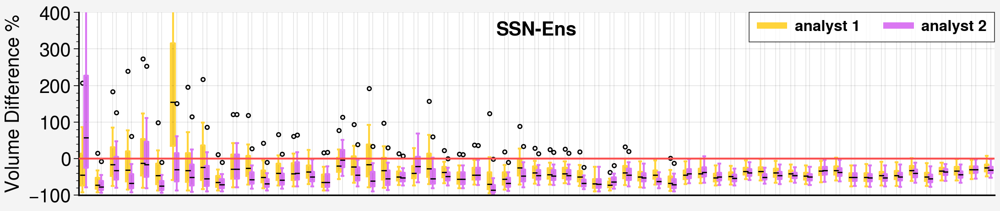

In [222]:
sample_div_plot(mss3_df, "SSN-Ens", True, doxlabel=False, ylim=(-100, 400), df_name="mss3")

61
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']
61
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']


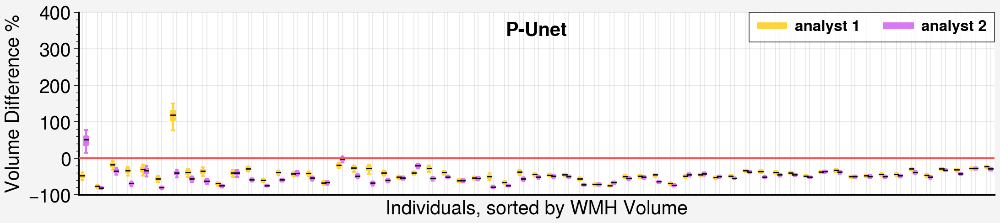

In [223]:
sample_div_plot(mss3_df, "P-Unet", True, True, ylim=(-100, 400), df_name="mss3")

60
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']
60
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']


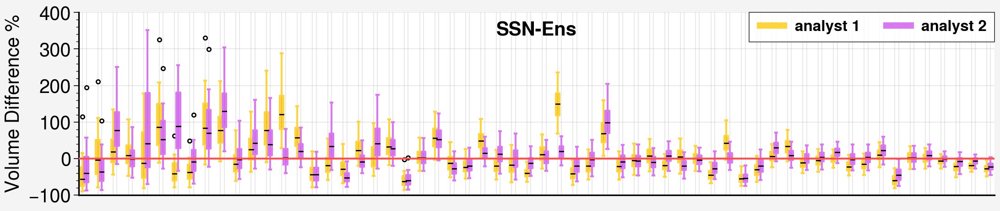

In [224]:
sample_div_plot(challenge_df, "SSN-Ens", True, doxlabel=False, ylim=(-100, 400), df_name="challenge")

60
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']
60
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']


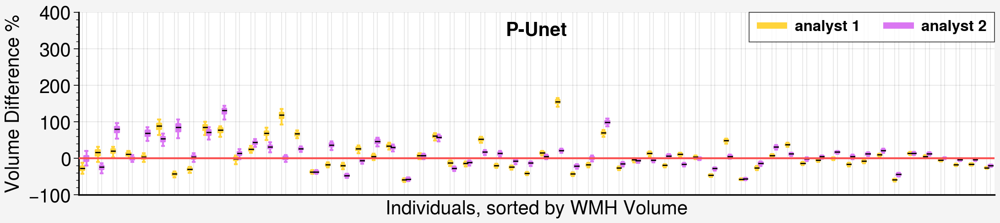

In [225]:
sample_div_plot(challenge_df, "P-Unet", True, True, ylim=(-100, 400), df_name="challenge")

10
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']
10
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']


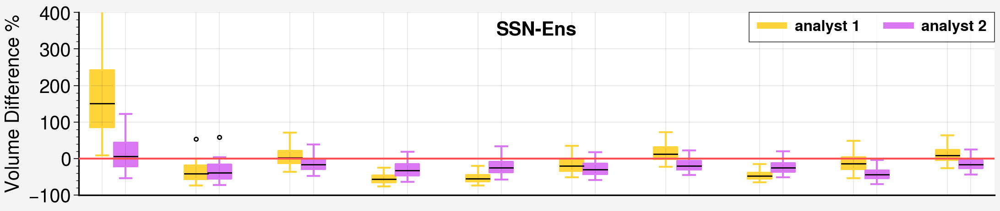

In [226]:
sample_div_plot(lbc_df, "SSN-Ens", True, doxlabel=False, ylim=(-100, 400), df_name="lbc")

10
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']
10
10
10
['whiskers', 'caps', 'boxes', 'medians', 'fliers', 'means']


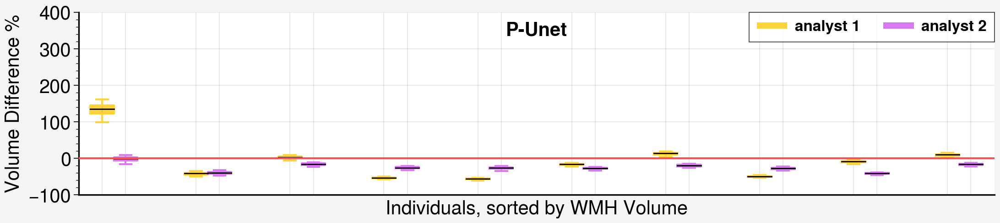

In [227]:
sample_div_plot(lbc_df, "P-Unet", True, True, ylim=(-100, 400), df_name="lbc")

### tables of metrics

In [230]:
pd.set_option('display.float_format',
      lambda x: '{:,.2f}'.format(x) if abs(x) < 10000 else '{:,.0f}'.format(x))

In [254]:
def get_metrics_csv(df_name):
    if df_name == "mss3":
        base_df = mss3_df
    elif df_name == "lbc":
        base_df = lbc_df
    elif df_name == "challenge":
        base_df = challenge_df
    else:
        raise ValueError()
    dfs = []
    selected_keys = ["GED_vol_sorted", "sUIRO", "sJUEO", "sUEO_r1", "sUEO_r2", "s_ed_UIRO", "deep_sUIRO", "pv_sUIRO", "deep_sJUEO", "pv_sJUEO", "mean_ind_mean_uncert", "all_mean_size_FP_uncertainty_ccs_all_t0.20"]
    for key in selected_keys:
        dfs.append(mean_and_95_conf_over_cvfold(base_df, key + "_ss10", return_sem=False))
    standard_metrics_df = pd.concat(dfs, axis=1)
    
    standard_metrics_df.index.rename('Uncertainty Type', inplace=True)
    
    selected_keys = ["GED", "sUIRO", "sJUEO", "sUEO_r1", "sUEO_r2", "s_ed_UIRO", "deep_sUIRO", "pv_sUIRO", "deep_sJUEO", "pv_sJUEO", "mean_ind_mean_uncert", "all_mean_size_FP_uncertainty_ccs_all_t0.20"]
    for key in standard_metrics_df.keys():
        standard_metrics_df[key] = [f'{value:,.2f}' for value in standard_metrics_df[key].values]
        if "95" in key:
            standard_metrics_df = standard_metrics_df.rename(columns={key:""})
            continue
        for k in selected_keys:
            if k in key and "_" + k not in key:
                standard_metrics_df = standard_metrics_df.rename(columns={key:k})
                break
    
    standard_metrics_df.to_csv(f"per_model_IR_metrics_{df_name}.csv")
    return standard_metrics_df

In [255]:
mss3_standard_metrics = get_metrics_csv("mss3")
mss3_standard_metrics

,GED,,sUIRO,,sJUEO,,sUEO_r1,,sUEO_r2,,...,pv_sUIRO,,deep_sJUEO,,pv_sJUEO,,mean_ind_mean_uncert,,all_mean_size_FP_uncertainty_ccs_all_t0.20,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,,
Ens,0.50,0.02,0.23,0.01,0.37,0.01,0.37,0.01,0.40,0.00,...,0.29,0.01,0.26,0.01,0.45,0.01,0.18,0.01,13.55,0.96
Ind,0.90,0.05,0.22,0.01,0.43,0.00,0.43,0.01,0.41,0.01,...,0.26,0.01,0.39,0.02,0.45,0.01,0.13,0.01,6.06,0.44
MC-Drop,0.71,0.04,0.21,0.03,0.38,0.01,0.38,0.01,0.38,0.01,...,0.25,0.04,0.31,0.03,0.42,0.01,0.12,0.03,8.75,0.68
P-Unet,0.90,0.07,0.21,0.01,0.42,0.02,0.42,0.02,0.39,0.02,...,0.24,0.02,0.39,0.02,0.43,0.02,0.12,0.02,5.54,0.25
SSN,0.63,0.04,0.22,0.02,0.42,0.01,0.42,0.01,0.42,0.01,...,0.26,0.02,0.36,0.02,0.46,0.01,0.15,0.02,7.19,0.74
SSN-Ens,0.48,0.02,0.25,0.00,0.40,0.01,0.40,0.01,0.42,0.00,...,0.29,0.01,0.30,0.01,0.45,0.00,0.17,0.02,10.54,0.43


In [256]:
lbc_standard_metrics = get_metrics_csv("lbc")
lbc_standard_metrics

,GED,,sUIRO,,sJUEO,,sUEO_r1,,sUEO_r2,,...,pv_sUIRO,,deep_sJUEO,,pv_sJUEO,,mean_ind_mean_uncert,,all_mean_size_FP_uncertainty_ccs_all_t0.20,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,,
Ens,0.19,0.02,0.40,0.01,0.39,0.04,0.42,0.01,0.45,0.03,...,0.44,0.01,0.20,0.03,0.44,0.03,0.20,0.02,10.02,2.16
Ind,0.49,0.04,0.41,0.01,0.42,0.01,0.44,0.01,0.46,0.01,...,0.44,0.01,0.31,0.04,0.44,0.01,0.19,0.01,5.09,0.47
MC-Drop,0.38,0.07,0.37,0.02,0.43,0.06,0.42,0.01,0.45,0.04,...,0.40,0.03,0.26,0.06,0.47,0.04,0.15,0.05,6.64,2.22
P-Unet,0.44,0.05,0.42,0.01,0.44,0.01,0.45,0.01,0.46,0.01,...,0.44,0.01,0.35,0.04,0.45,0.01,0.20,0.02,4.34,0.36
SSN,0.26,0.05,0.42,0.02,0.40,0.02,0.43,0.01,0.44,0.01,...,0.44,0.02,0.29,0.03,0.42,0.02,0.21,0.03,5.42,0.77
SSN-Ens,0.15,0.02,0.45,0.01,0.38,0.02,0.45,0.01,0.45,0.01,...,0.47,0.01,0.25,0.02,0.40,0.02,0.24,0.02,5.92,0.65


In [257]:
challenge_standard_metrics = get_metrics_csv("challenge")
challenge_standard_metrics

,GED,,sUIRO,,sJUEO,,sUEO_r1,,sUEO_r2,,...,pv_sUIRO,,deep_sJUEO,,pv_sJUEO,,mean_ind_mean_uncert,,all_mean_size_FP_uncertainty_ccs_all_t0.20,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,,
Ens,0.44,0.00,0.29,0.00,0.43,0.00,0.44,0.00,0.44,0.00,...,0.32,0.00,0.32,0.00,0.47,0.00,0.29,0.00,11.73,0.45
Ind,0.78,0.03,0.30,0.00,0.46,0.01,0.45,0.00,0.46,0.00,...,0.33,0.01,0.36,0.01,0.49,0.01,0.25,0.01,8.72,4.47
MC-Drop,0.59,0.02,0.28,0.01,0.45,0.01,0.44,0.00,0.45,0.00,...,0.31,0.01,0.34,0.01,0.49,0.01,0.25,0.01,8.59,0.76
P-Unet,0.77,0.04,0.30,0.01,0.48,0.02,0.47,0.02,0.48,0.02,...,0.32,0.01,0.39,0.02,0.51,0.01,0.25,0.01,5.37,0.27
SSN,0.57,0.03,0.29,0.01,0.45,0.01,0.45,0.01,0.45,0.01,...,0.32,0.01,0.36,0.02,0.48,0.01,0.26,0.01,6.79,0.57
SSN-Ens,0.45,0.01,0.31,0.00,0.45,0.00,0.45,0.00,0.46,0.00,...,0.33,0.00,0.35,0.01,0.47,0.00,0.29,0.01,10.18,0.44


### distance based JUEO and UIRO

In [238]:
results_folder = "./distance_based_overlap_results/"
out_domain_results = os.listdir(results_folder)

In [239]:
out_domain_results = [i for i in out_domain_results if ".csv" in i]

In [240]:
UNCERTAINTY_TYPES = {
    "SEnt",
    "MC-Drop",
    "Ens",
    "Evid",
    "Ind",
    "P-Unet",
    "SSN",
    "SSN-Ens",
}

In [241]:
def convert_files_to_large_df(folder, filenames, excluded_rows = [], dataset_name="mss3"):
    dfs = []
    for fn in tqdm(natsorted(filenames)):
        if dataset_name not in fn:
            continue
        df = pd.read_csv(os.path.join(folder, fn))
        if "_evid_" in fn:
            uncertainty_type = "Evid"
        elif "_deterministic_" in fn:
            uncertainty_type = "SEnt"
        elif "_ind_" in fn:
            uncertainty_type = "Ind"
        elif "_punet_" in fn:
            uncertainty_type = "P-Unet"
        elif "_ens" in fn and "ssn" not in fn:
            uncertainty_type = "Ens"
        elif "_mc_drop" in fn:
            uncertainty_type = "MC-Drop"
        elif "_ssn_ens_" in fn:
            uncertainty_type = "SSN-Ens"
        elif "_ssn_" in fn and "_ens" not in fn:
            uncertainty_type = "SSN"
        else:
            print("uncertainty type unclear for ", fn)
            continue
            
        cv_fold = fn.split("_")[-2][-1]
        num_samples = fn.split("_")[-1][2:4]
        if num_samples[-1] == '.':
            num_samples = num_samples[:-1]
        
        if len(excluded_rows) > 0:
            df = df.drop(index=excluded_rows, inplace=False)
        df = df.rename(columns = {key:key + f"_ss{num_samples}" for key in df.keys() if key.split("_")[-1][0:2] != "ss" and "Unnamed" not in key})
        df['uncertainty_type'] = [uncertainty_type for _ in range(len(df))]
        df['cv_fold'] = [cv_fold for _ in range(len(df))]
        
        if int(num_samples) > 10 and uncertainty_type == "Ens":
            continue # we only have ensemble up to size 10, but the results got copied into values greater than 10 somehow..

        dfs.append(df)
    
    return pd.concat(dfs, ignore_index=False)

In [242]:
mss3_overlap_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="mss3")
lbc_overlap_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="lbc")
challenge_overlap_df = convert_files_to_large_df(results_folder, out_domain_results, dataset_name="challenge")

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 108/108 [00:02<00:00, 36.39it/s]


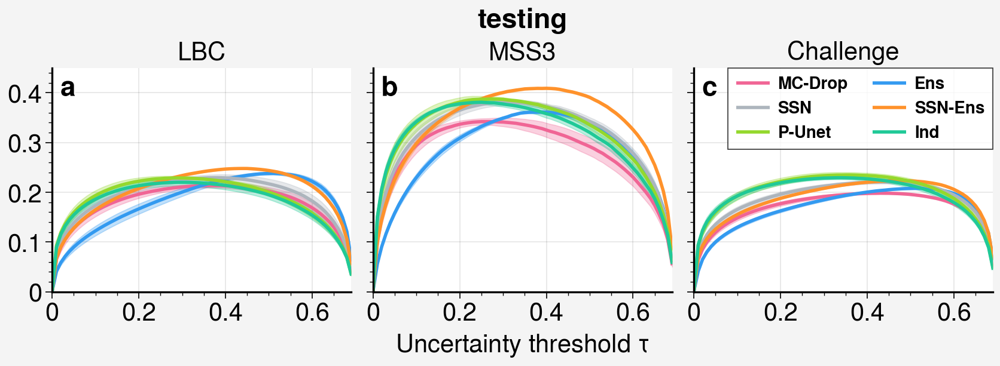

In [244]:
per_dataset_plot_metric_threshold("dUIRO_curves_d2.00", "", "testing", ylim=(0, 0.45), dfs=[mss3_overlap_df, lbc_overlap_df, challenge_overlap_df])
                                                                                                                                        
                                                                                                                                        

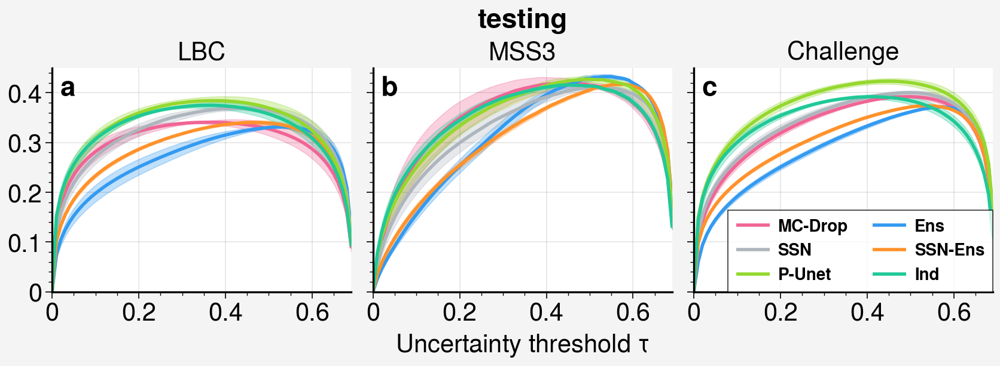

In [245]:
per_dataset_plot_metric_threshold("dJUEO_curves_d2.00", "", "testing", ylim=(0, 0.45), dfs=[mss3_overlap_df, lbc_overlap_df, challenge_overlap_df])
  

**Note**: 2mm seems to be optimal across all datasets. However, it doesn't really do anything to change the metrics much or their ordering, however sometimes P-Unet does actually do better.

In [246]:
def get_overlap_metrics_csv(df_name, kind="UIRO"):
    if df_name == "mss3":
        base_df = mss3_overlap_df
    elif df_name == "lbc":
        base_df = lbc_overlap_df
    elif df_name == "challenge":
        base_df = challenge_overlap_df
    else:
        raise ValueError()
    dfs = []
    selected_keys = [f"soft_d{kind}_d0.50", f"soft_d{kind}_d1.00", f"soft_d{kind}_d1.50", f"soft_d{kind}_d2.00", f"soft_d{kind}_d2.50", f"soft_d{kind}_d3.00", f"soft_d{kind}_d3.50", f"soft_d{kind}_d4.00", f"soft_d{kind}_d4.50", f"soft_d{kind}_d5.00"]
    for key in selected_keys:
        dfs.append(mean_and_95_conf_over_cvfold(base_df, key + "_ss10", return_sem=False))
    standard_metrics_df = pd.concat(dfs, axis=1)
    
    standard_metrics_df.index.rename('Uncertainty Type', inplace=True)
    
    for key in standard_metrics_df.keys():
        standard_metrics_df[key] = [f'{value:,.2f}' for value in standard_metrics_df[key].values]
        if "95" in key:
            standard_metrics_df = standard_metrics_df.rename(columns={key:""})
            continue
        for k in selected_keys:
            if k in key and "_" + k not in key:
                standard_metrics_df = standard_metrics_df.rename(columns={key:k})
                break
    
    standard_metrics_df.to_csv(f"per_model_IR_metrics_{df_name}.csv")
    return standard_metrics_df

In [247]:
get_overlap_metrics_csv("mss3", kind="UIRO")

,soft_dUIRO_d0.50,,soft_dUIRO_d1.00,,soft_dUIRO_d1.50,,soft_dUIRO_d2.00,,soft_dUIRO_d2.50,,soft_dUIRO_d3.00,,soft_dUIRO_d3.50,,soft_dUIRO_d4.00,,soft_dUIRO_d4.50,,soft_dUIRO_d5.00,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,
Ens,0.23,0.01,0.23,0.01,0.27,0.01,0.27,0.01,0.28,0.01,0.28,0.01,0.28,0.01,0.28,0.01,0.28,0.01,0.27,0.01
Ind,0.21,0.02,0.21,0.02,0.25,0.02,0.25,0.02,0.26,0.02,0.26,0.02,0.26,0.02,0.25,0.02,0.25,0.02,0.25,0.02
MC-Drop,0.22,0.01,0.22,0.01,0.25,0.01,0.25,0.01,0.26,0.02,0.26,0.02,0.26,0.02,0.26,0.02,0.26,0.02,0.25,0.02
P-Unet,0.21,0.01,0.21,0.01,0.26,0.01,0.26,0.01,0.26,0.02,0.26,0.02,0.26,0.02,0.26,0.02,0.26,0.02,0.26,0.02
SSN,0.22,0.02,0.22,0.02,0.27,0.02,0.27,0.02,0.28,0.02,0.28,0.02,0.28,0.03,0.28,0.03,0.27,0.03,0.27,0.03
SSN-Ens,0.25,0.01,0.25,0.01,0.29,0.00,0.29,0.00,0.30,0.00,0.30,0.00,0.30,0.00,0.30,0.00,0.30,0.00,0.30,0.00


In [248]:
get_overlap_metrics_csv("challenge", kind="UIRO")

,soft_dUIRO_d0.50,,soft_dUIRO_d1.00,,soft_dUIRO_d1.50,,soft_dUIRO_d2.00,,soft_dUIRO_d2.50,,soft_dUIRO_d3.00,,soft_dUIRO_d3.50,,soft_dUIRO_d4.00,,soft_dUIRO_d4.50,,soft_dUIRO_d5.00,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,
Ens,0.24,0.01,0.24,0.01,0.26,0.01,0.26,0.01,0.24,0.00,0.23,0.00,0.23,0.00,0.23,0.00,0.23,0.00,0.23,0.00
Ind,0.26,0.01,0.26,0.01,0.28,0.01,0.28,0.01,0.26,0.01,0.26,0.01,0.25,0.01,0.25,0.01,0.25,0.01,0.25,0.01
MC-Drop,0.23,0.01,0.23,0.01,0.26,0.01,0.26,0.01,0.24,0.01,0.24,0.01,0.23,0.01,0.23,0.01,0.24,0.01,0.24,0.01
P-Unet,0.26,0.02,0.26,0.02,0.29,0.01,0.29,0.01,0.27,0.01,0.26,0.01,0.26,0.01,0.26,0.01,0.26,0.01,0.26,0.01
SSN,0.25,0.01,0.25,0.01,0.28,0.01,0.28,0.01,0.26,0.01,0.26,0.01,0.26,0.01,0.26,0.01,0.26,0.01,0.26,0.01
SSN-Ens,0.26,0.00,0.26,0.00,0.28,0.00,0.28,0.00,0.26,0.00,0.26,0.00,0.25,0.00,0.25,0.00,0.25,0.00,0.25,0.00


In [249]:
get_overlap_metrics_csv("lbc", kind="UIRO")

,soft_dUIRO_d0.50,,soft_dUIRO_d1.00,,soft_dUIRO_d1.50,,soft_dUIRO_d2.00,,soft_dUIRO_d2.50,,soft_dUIRO_d3.00,,soft_dUIRO_d3.50,,soft_dUIRO_d4.00,,soft_dUIRO_d4.50,,soft_dUIRO_d5.00,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,
Ens,0.40,0.01,0.40,0.01,0.40,0.01,0.40,0.01,0.38,0.01,0.38,0.01,0.38,0.01,0.38,0.01,0.38,0.01,0.38,0.01
Ind,0.40,0.02,0.40,0.02,0.40,0.02,0.40,0.02,0.38,0.02,0.38,0.02,0.38,0.02,0.38,0.02,0.38,0.02,0.38,0.02
MC-Drop,0.38,0.03,0.38,0.03,0.37,0.03,0.37,0.03,0.36,0.03,0.36,0.03,0.36,0.03,0.36,0.03,0.36,0.03,0.36,0.03
P-Unet,0.40,0.01,0.40,0.01,0.41,0.02,0.41,0.02,0.40,0.02,0.39,0.02,0.39,0.02,0.39,0.02,0.39,0.02,0.39,0.02
SSN,0.41,0.02,0.41,0.02,0.41,0.02,0.41,0.02,0.40,0.02,0.40,0.02,0.40,0.02,0.40,0.02,0.40,0.02,0.40,0.02
SSN-Ens,0.45,0.00,0.45,0.00,0.45,0.00,0.45,0.00,0.44,0.00,0.43,0.00,0.43,0.00,0.43,0.00,0.43,0.00,0.43,0.00


In [250]:
get_overlap_metrics_csv("mss3", kind="JUEO")

,soft_dJUEO_d0.50,,soft_dJUEO_d1.00,,soft_dJUEO_d1.50,,soft_dJUEO_d2.00,,soft_dJUEO_d2.50,,soft_dJUEO_d3.00,,soft_dJUEO_d3.50,,soft_dJUEO_d4.00,,soft_dJUEO_d4.50,,soft_dJUEO_d5.00,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,
Ens,0.36,0.01,0.36,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01
Ind,0.42,0.02,0.42,0.02,0.42,0.03,0.42,0.03,0.42,0.02,0.42,0.02,0.42,0.02,0.42,0.02,0.41,0.02,0.41,0.02
MC-Drop,0.38,0.02,0.38,0.02,0.39,0.02,0.39,0.02,0.39,0.02,0.39,0.02,0.38,0.02,0.38,0.02,0.38,0.02,0.38,0.02
P-Unet,0.43,0.03,0.43,0.03,0.43,0.03,0.43,0.03,0.43,0.03,0.43,0.03,0.42,0.03,0.42,0.03,0.42,0.03,0.42,0.03
SSN,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.41,0.01
SSN-Ens,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01


In [251]:
get_overlap_metrics_csv("challenge", kind="JUEO")

,soft_dJUEO_d0.50,,soft_dJUEO_d1.00,,soft_dJUEO_d1.50,,soft_dJUEO_d2.00,,soft_dJUEO_d2.50,,soft_dJUEO_d3.00,,soft_dJUEO_d3.50,,soft_dJUEO_d4.00,,soft_dJUEO_d4.50,,soft_dJUEO_d5.00,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,
Ens,0.38,0.01,0.38,0.01,0.39,0.01,0.39,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01,0.37,0.01
Ind,0.44,0.02,0.44,0.02,0.44,0.02,0.44,0.02,0.43,0.02,0.43,0.01,0.42,0.01,0.42,0.01,0.42,0.01,0.42,0.01
MC-Drop,0.43,0.00,0.43,0.00,0.44,0.00,0.44,0.00,0.42,0.00,0.42,0.00,0.42,0.00,0.42,0.00,0.42,0.00,0.42,0.00
P-Unet,0.47,0.01,0.47,0.01,0.47,0.01,0.47,0.01,0.46,0.01,0.46,0.01,0.45,0.01,0.45,0.01,0.45,0.01,0.45,0.01
SSN,0.45,0.01,0.45,0.01,0.45,0.01,0.45,0.01,0.43,0.01,0.43,0.01,0.43,0.01,0.43,0.01,0.43,0.01,0.43,0.01
SSN-Ens,0.41,0.01,0.41,0.01,0.41,0.01,0.41,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01,0.39,0.01


In [252]:
get_overlap_metrics_csv("lbc", kind="JUEO")

,soft_dJUEO_d0.50,,soft_dJUEO_d1.00,,soft_dJUEO_d1.50,,soft_dJUEO_d2.00,,soft_dJUEO_d2.50,,soft_dJUEO_d3.00,,soft_dJUEO_d3.50,,soft_dJUEO_d4.00,,soft_dJUEO_d4.50,,soft_dJUEO_d5.00,
Uncertainty Type,,,,,,,,,,,,,,,,,,,,
Ens,0.39,0.03,0.39,0.03,0.41,0.02,0.41,0.02,0.37,0.02,0.37,0.02,0.36,0.02,0.36,0.03,0.36,0.03,0.36,0.03
Ind,0.44,0.02,0.44,0.02,0.46,0.01,0.46,0.01,0.41,0.01,0.40,0.01,0.39,0.01,0.39,0.02,0.38,0.02,0.38,0.02
MC-Drop,0.44,0.04,0.44,0.04,0.45,0.03,0.45,0.03,0.42,0.04,0.41,0.04,0.40,0.04,0.40,0.04,0.40,0.04,0.40,0.04
P-Unet,0.44,0.03,0.44,0.03,0.46,0.02,0.46,0.02,0.41,0.02,0.41,0.02,0.39,0.02,0.39,0.02,0.38,0.02,0.38,0.02
SSN,0.41,0.03,0.41,0.03,0.44,0.03,0.44,0.03,0.39,0.02,0.38,0.02,0.37,0.02,0.37,0.02,0.36,0.02,0.36,0.02
SSN-Ens,0.38,0.01,0.38,0.01,0.42,0.01,0.42,0.01,0.37,0.01,0.36,0.01,0.34,0.01,0.34,0.01,0.33,0.01,0.33,0.01
